# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

In [2]:
import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

torch.set_default_tensor_type(torch.FloatTensor)

## Specify `Param` object

In [18]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.train import run as hmc_run
from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False

param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 5,
    'beta': 3.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 100,
    'n_epoch': 100,
    'n_layers': 24,
     'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 5,
    'batch_size': 1024,
    'print_freq': 100,
    'plot_freq': 100,
})


param = Param(**param)
logger.log(repr(param))
logger.log(f'train_config: {train_config}')

DAYSTR = io.get_timestamp('%Y-%m-%d')
TSTAMP = io.get_timestamp('%Y-%m-%d-%H%M')
NOW = io.get_timestamp('%Y-%m-%d-%H%M%S')

PARAM_DIR = os.path.join(LOGS_DIR, param.uniquestr())
METRICS_DIR = os.path.join(PARAM_DIR, 'metrics')
MODEL_DIR = os.path.join(PARAM_DIR, 'models')
PLOTS_DIR = os.path.join(PARAM_DIR, 'plots')

io.check_else_make_dir(PARAM_DIR)
io.check_else_make_dir(MODEL_DIR)
io.check_else_make_dir(METRICS_DIR)
io.check_else_make_dir(PLOTS_DIR)

[04:47:45]  Param:                                                                           
            ----------------                                                                 
            beta=3.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

[04:47:46]  train_config: TrainConfig(n_era=100, n_epoch=100, n_layers=24, n_s_nets=2,       
            hidden_sizes=[8, 8], kernel_size=5, base_lr=0.001, batch_size=1024,              
            print_freq=100, plot_freq=100, with_force=False)

In [25]:
param = {
    'L': 8,
    'tau': 0.5,
    'nrun': 5,
    'beta': 3.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
}

param = Param(**param)

## Specify directories for saving model, etc

In [26]:
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

hmc_metrics_dir = os.path.join(METRICS_DIR, 'hmc', TSTAMP)
outfile = os.path.join(hmc_metrics_dir, f'hmc_metrics.z')

io.save_history(metrics, outfile, name='hmc_metrics')

[06:24:02]  Param:                                                                           
            ----------------                                                                 
            beta=3.5                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

            action=1.000 plaq=0.000 charge=0.000

[06:24:03]  dt=0.006 traj=2 accept=True dH=-0.081 expdH=1.084 dq=0.000

            dt=0.006 traj=7 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.006 traj=12 accept=True dH=0.102 expdH=0.903 dq=0.000

            dt=0.006 traj=17 accept=True dH=0.066 expdH=0.936 dq=0.000

            dt=0.006 traj=22 accept=False dH=0.053 expdH=0.948 dq=0.000

            dt=0.006 traj=27 accept=True dH=0.017 expdH=0.984 dq=0.000

            dt=0.006 traj=32 accept=True dH=-0.081 expdH=1.084 dq=0.000

            dt=0.006 traj=37 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.006 traj=42 accept=True dH=-0.051 expdH=1.052 dq=0.000

            dt=0.006 traj=47 accept=True dH=-0.073 expdH=1.076 dq=0.000

            dt=0.006 traj=52 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.006 traj=57 accept=True dH=-0.053 expdH=1.054 dq=0.000

            dt=0.006 traj=62 accept=True dH=0.034 expdH=0.966 dq=0.000

            dt=0.006 traj=67 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.006 traj=72 accept=True dH=-0.031 expdH=1.032 dq=1.000

            dt=0.006 traj=77 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.006 traj=82 accept=True dH=-0.104 expdH=1.109 dq=0.000

            dt=0.006 traj=87 accept=True dH=0.063 expdH=0.939 dq=0.000

[06:24:04]  dt=0.006 traj=92 accept=True dH=-0.032 expdH=1.033 dq=0.000

            dt=0.006 traj=97 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.006 traj=102 accept=True dH=-0.028 expdH=1.028 dq=0.000

            dt=0.006 traj=107 accept=True dH=-0.061 expdH=1.063 dq=0.000

            dt=0.006 traj=112 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.006 traj=117 accept=True dH=0.066 expdH=0.937 dq=0.000

            dt=0.006 traj=122 accept=True dH=0.025 expdH=0.975 dq=0.000

            dt=0.006 traj=127 accept=True dH=0.128 expdH=0.879 dq=0.000

            dt=0.006 traj=132 accept=True dH=-0.028 expdH=1.028 dq=0.000

            dt=0.006 traj=137 accept=True dH=0.134 expdH=0.875 dq=0.000

            dt=0.006 traj=142 accept=False dH=0.144 expdH=0.865 dq=0.000

            dt=0.006 traj=147 accept=True dH=-0.098 expdH=1.102 dq=0.000

            dt=0.006 traj=152 accept=True dH=-0.060 expdH=1.062 dq=0.000

            dt=0.006 traj=157 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.006 traj=162 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.006 traj=167 accept=True dH=0.034 expdH=0.966 dq=0.000

            dt=0.006 traj=172 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.006 traj=177 accept=True dH=-0.070 expdH=1.072 dq=0.000

            dt=0.006 traj=182 accept=True dH=0.060 expdH=0.941 dq=0.000

            dt=0.006 traj=187 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.006 traj=192 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.006 traj=197 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.006 traj=202 accept=True dH=-0.067 expdH=1.070 dq=0.000

            dt=0.006 traj=207 accept=True dH=0.009 expdH=0.991 dq=0.000

            dt=0.006 traj=212 accept=True dH=-0.039 expdH=1.040 dq=0.000

            dt=0.006 traj=217 accept=True dH=0.090 expdH=0.914 dq=0.000

            dt=0.006 traj=222 accept=True dH=0.067 expdH=0.936 dq=0.000

            dt=0.006 traj=227 accept=True dH=0.020 expdH=0.980 dq=0.000

[06:24:05]  dt=0.006 traj=232 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.006 traj=237 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.006 traj=242 accept=True dH=0.027 expdH=0.973 dq=0.000

            dt=0.006 traj=247 accept=True dH=0.015 expdH=0.985 dq=1.000

            dt=0.006 traj=252 accept=True dH=0.036 expdH=0.965 dq=0.000

            dt=0.006 traj=258 accept=True dH=0.105 expdH=0.900 dq=0.000

            dt=0.006 traj=263 accept=True dH=0.022 expdH=0.979 dq=0.000

            dt=0.006 traj=268 accept=True dH=0.018 expdH=0.983 dq=0.000

            dt=0.006 traj=273 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.006 traj=278 accept=True dH=-0.033 expdH=1.034 dq=0.000

            dt=0.006 traj=283 accept=True dH=-0.090 expdH=1.094 dq=0.000

            dt=0.006 traj=288 accept=True dH=0.056 expdH=0.946 dq=0.000

            dt=0.006 traj=293 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.006 traj=298 accept=True dH=-0.070 expdH=1.073 dq=0.000

            dt=0.006 traj=303 accept=True dH=-0.056 expdH=1.058 dq=0.000

            dt=0.006 traj=308 accept=True dH=0.074 expdH=0.929 dq=1.000

            dt=0.006 traj=313 accept=True dH=-0.056 expdH=1.058 dq=0.000

            dt=0.006 traj=318 accept=True dH=0.035 expdH=0.966 dq=0.000

            dt=0.006 traj=323 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.006 traj=328 accept=True dH=-0.033 expdH=1.034 dq=0.000

            dt=0.006 traj=333 accept=True dH=-0.034 expdH=1.034 dq=0.000

            dt=0.006 traj=338 accept=True dH=-0.042 expdH=1.043 dq=0.000

            dt=0.006 traj=343 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.006 traj=348 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.006 traj=353 accept=True dH=-0.024 expdH=1.024 dq=0.000

            dt=0.006 traj=358 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.006 traj=363 accept=True dH=0.034 expdH=0.966 dq=0.000

            dt=0.006 traj=368 accept=True dH=0.063 expdH=0.939 dq=0.000

[06:24:06]  dt=0.006 traj=373 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.006 traj=378 accept=True dH=0.021 expdH=0.979 dq=0.000

            dt=0.006 traj=383 accept=True dH=-0.003 expdH=1.003 dq=1.000

            dt=0.006 traj=388 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.006 traj=393 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.006 traj=398 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.006 traj=403 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.006 traj=408 accept=True dH=-0.051 expdH=1.052 dq=0.000

            dt=0.006 traj=413 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.006 traj=418 accept=True dH=-0.038 expdH=1.039 dq=1.000

            dt=0.006 traj=423 accept=True dH=0.030 expdH=0.970 dq=0.000

            dt=0.006 traj=428 accept=True dH=0.075 expdH=0.927 dq=0.000

            dt=0.006 traj=433 accept=True dH=0.131 expdH=0.877 dq=0.000

            dt=0.006 traj=438 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.006 traj=443 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.006 traj=448 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.006 traj=453 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.006 traj=458 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.006 traj=463 accept=True dH=0.045 expdH=0.956 dq=0.000

            dt=0.006 traj=468 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.006 traj=473 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.006 traj=478 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.006 traj=483 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.006 traj=488 accept=True dH=-0.108 expdH=1.114 dq=0.000

            dt=0.006 traj=493 accept=True dH=-0.037 expdH=1.038 dq=0.000

            dt=0.006 traj=498 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.006 traj=503 accept=True dH=-0.006 expdH=1.006 dq=0.000

[06:24:07]  dt=0.006 traj=508 accept=True dH=-0.054 expdH=1.056 dq=0.000

            dt=0.006 traj=514 accept=True dH=0.009 expdH=0.991 dq=0.000

            dt=0.006 traj=519 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.006 traj=524 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.006 traj=529 accept=True dH=0.067 expdH=0.935 dq=0.000

            dt=0.006 traj=534 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.006 traj=539 accept=True dH=0.069 expdH=0.933 dq=0.000

            dt=0.006 traj=544 accept=True dH=-0.079 expdH=1.082 dq=0.000

            dt=0.006 traj=549 accept=True dH=0.064 expdH=0.938 dq=0.000

            dt=0.006 traj=554 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.006 traj=559 accept=True dH=0.023 expdH=0.978 dq=0.000

            dt=0.006 traj=564 accept=True dH=-0.026 expdH=1.027 dq=0.000

            dt=0.006 traj=569 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.006 traj=574 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.006 traj=579 accept=True dH=0.122 expdH=0.885 dq=0.000

            dt=0.006 traj=584 accept=True dH=-0.037 expdH=1.038 dq=0.000

            dt=0.006 traj=589 accept=True dH=-0.056 expdH=1.057 dq=0.000

            dt=0.006 traj=594 accept=True dH=-0.090 expdH=1.094 dq=0.000

            dt=0.006 traj=599 accept=True dH=-0.051 expdH=1.053 dq=0.000

            dt=0.006 traj=604 accept=True dH=-0.089 expdH=1.093 dq=0.000

            dt=0.006 traj=609 accept=True dH=0.058 expdH=0.944 dq=0.000

            dt=0.006 traj=614 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.006 traj=619 accept=True dH=0.058 expdH=0.944 dq=0.000

            dt=0.006 traj=624 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.006 traj=629 accept=True dH=0.051 expdH=0.950 dq=0.000

            dt=0.006 traj=634 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.006 traj=639 accept=True dH=-0.028 expdH=1.029 dq=0.000

            dt=0.006 traj=644 accept=True dH=-0.041 expdH=1.042 dq=0.000

[06:24:08]  dt=0.006 traj=649 accept=True dH=-0.013 expdH=1.013 dq=0.000

            dt=0.006 traj=654 accept=True dH=0.048 expdH=0.953 dq=0.000

            dt=0.006 traj=659 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.006 traj=664 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.006 traj=669 accept=True dH=0.035 expdH=0.965 dq=0.000

            dt=0.006 traj=674 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.006 traj=679 accept=True dH=-0.032 expdH=1.032 dq=0.000

            dt=0.006 traj=684 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.006 traj=689 accept=True dH=0.058 expdH=0.943 dq=0.000

            dt=0.006 traj=694 accept=True dH=-0.045 expdH=1.046 dq=0.000

            dt=0.006 traj=699 accept=True dH=-0.055 expdH=1.056 dq=0.000

            dt=0.006 traj=704 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.006 traj=709 accept=True dH=0.053 expdH=0.948 dq=1.000

            dt=0.006 traj=714 accept=True dH=0.048 expdH=0.953 dq=0.000

            dt=0.006 traj=719 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.006 traj=724 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.006 traj=729 accept=True dH=0.054 expdH=0.948 dq=0.000

            dt=0.006 traj=734 accept=True dH=0.078 expdH=0.925 dq=0.000

            dt=0.006 traj=739 accept=True dH=0.074 expdH=0.929 dq=0.000

            dt=0.006 traj=744 accept=True dH=0.019 expdH=0.981 dq=0.000

            dt=0.006 traj=749 accept=True dH=-0.038 expdH=1.039 dq=0.000

            dt=0.006 traj=754 accept=True dH=-0.028 expdH=1.028 dq=0.000

            dt=0.006 traj=759 accept=True dH=0.077 expdH=0.926 dq=0.000

            dt=0.006 traj=764 accept=True dH=0.013 expdH=0.987 dq=0.000

            dt=0.006 traj=770 accept=True dH=0.007 expdH=0.993 dq=0.000

            dt=0.006 traj=775 accept=True dH=-0.035 expdH=1.035 dq=0.000

            dt=0.006 traj=780 accept=True dH=-0.037 expdH=1.038 dq=0.000

[06:24:09]  dt=0.006 traj=785 accept=True dH=0.037 expdH=0.964 dq=0.000

            dt=0.006 traj=790 accept=True dH=0.086 expdH=0.917 dq=0.000

            dt=0.006 traj=795 accept=True dH=0.064 expdH=0.938 dq=0.000

            dt=0.006 traj=800 accept=True dH=0.053 expdH=0.948 dq=0.000

            dt=0.006 traj=805 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.006 traj=810 accept=True dH=0.030 expdH=0.970 dq=0.000

            dt=0.006 traj=815 accept=True dH=-0.072 expdH=1.074 dq=0.000

            dt=0.006 traj=820 accept=False dH=0.053 expdH=0.949 dq=0.000

            dt=0.006 traj=825 accept=True dH=-0.083 expdH=1.087 dq=0.000

            dt=0.006 traj=830 accept=True dH=-0.027 expdH=1.028 dq=0.000

            dt=0.006 traj=835 accept=True dH=0.085 expdH=0.919 dq=0.000

            dt=0.006 traj=840 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.006 traj=845 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.006 traj=850 accept=True dH=0.121 expdH=0.886 dq=0.000

            dt=0.006 traj=855 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.006 traj=860 accept=True dH=0.009 expdH=0.991 dq=0.000

            dt=0.006 traj=865 accept=True dH=-0.049 expdH=1.050 dq=0.000

            dt=0.006 traj=870 accept=True dH=0.030 expdH=0.971 dq=0.000

            dt=0.006 traj=875 accept=True dH=0.057 expdH=0.945 dq=0.000

            dt=0.006 traj=880 accept=True dH=0.057 expdH=0.945 dq=0.000

            dt=0.007 traj=885 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.006 traj=890 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.006 traj=895 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.006 traj=900 accept=True dH=0.010 expdH=0.990 dq=1.000

            dt=0.006 traj=905 accept=True dH=0.059 expdH=0.943 dq=0.000

            dt=0.006 traj=910 accept=True dH=0.066 expdH=0.936 dq=0.000

            dt=0.006 traj=915 accept=True dH=0.031 expdH=0.969 dq=0.000

            dt=0.006 traj=920 accept=True dH=-0.011 expdH=1.011 dq=0.000

[06:24:10]  dt=0.006 traj=925 accept=True dH=0.071 expdH=0.932 dq=0.000

            dt=0.006 traj=930 accept=True dH=0.016 expdH=0.984 dq=0.000

            dt=0.006 traj=935 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.006 traj=940 accept=True dH=0.074 expdH=0.929 dq=0.000

            dt=0.006 traj=945 accept=True dH=-0.051 expdH=1.052 dq=0.000

            dt=0.006 traj=950 accept=True dH=-0.033 expdH=1.033 dq=0.000

            dt=0.006 traj=955 accept=True dH=0.049 expdH=0.952 dq=0.000

            dt=0.006 traj=960 accept=True dH=-0.055 expdH=1.056 dq=0.000

            dt=0.006 traj=965 accept=True dH=0.017 expdH=0.984 dq=0.000

            dt=0.006 traj=970 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.006 traj=975 accept=True dH=-0.073 expdH=1.075 dq=0.000

            dt=0.006 traj=980 accept=True dH=-0.037 expdH=1.037 dq=0.000

            dt=0.006 traj=985 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.006 traj=990 accept=True dH=0.034 expdH=0.966 dq=0.000

            dt=0.006 traj=995 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.006 traj=1000 accept=True dH=0.022 expdH=0.978 dq=0.000

            dt=0.006 traj=1005 accept=True dH=0.018 expdH=0.983 dq=0.000

            dt=0.006 traj=1010 accept=True dH=0.073 expdH=0.930 dq=0.000

            dt=0.006 traj=1015 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.006 traj=1020 accept=True dH=0.054 expdH=0.947 dq=0.000

            dt=0.006 traj=1026 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.006 traj=1031 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.006 traj=1036 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.006 traj=1041 accept=True dH=0.077 expdH=0.926 dq=0.000

            dt=0.006 traj=1046 accept=True dH=-0.045 expdH=1.046 dq=1.000

            dt=0.006 traj=1051 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.006 traj=1056 accept=True dH=-0.027 expdH=1.027 dq=0.000

[06:24:11]  dt=0.006 traj=1061 accept=False dH=0.028 expdH=0.972 dq=0.000

            dt=0.006 traj=1066 accept=True dH=-0.058 expdH=1.059 dq=0.000

            dt=0.006 traj=1071 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.006 traj=1076 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.006 traj=1081 accept=True dH=-0.051 expdH=1.053 dq=0.000

            dt=0.006 traj=1086 accept=True dH=-0.088 expdH=1.092 dq=0.000

            dt=0.006 traj=1091 accept=True dH=0.024 expdH=0.976 dq=0.000

            dt=0.006 traj=1096 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.006 traj=1101 accept=True dH=-0.040 expdH=1.040 dq=0.000

            dt=0.006 traj=1106 accept=True dH=-0.001 expdH=1.001 dq=0.000

            dt=0.006 traj=1111 accept=True dH=-0.047 expdH=1.048 dq=0.000

            dt=0.006 traj=1116 accept=True dH=-0.084 expdH=1.087 dq=0.000

            dt=0.006 traj=1121 accept=True dH=-0.029 expdH=1.029 dq=0.000

            dt=0.006 traj=1126 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.006 traj=1131 accept=True dH=-0.015 expdH=1.015 dq=0.000

            dt=0.006 traj=1136 accept=True dH=-0.044 expdH=1.045 dq=0.000

            dt=0.006 traj=1141 accept=True dH=-0.028 expdH=1.028 dq=0.000

            dt=0.006 traj=1146 accept=True dH=0.074 expdH=0.928 dq=0.000

            dt=0.006 traj=1151 accept=True dH=0.034 expdH=0.967 dq=0.000

            dt=0.006 traj=1156 accept=True dH=-0.058 expdH=1.059 dq=0.000

            dt=0.006 traj=1161 accept=True dH=0.015 expdH=0.986 dq=0.000

            dt=0.006 traj=1166 accept=True dH=0.041 expdH=0.959 dq=0.000

            dt=0.006 traj=1171 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.006 traj=1176 accept=True dH=0.099 expdH=0.906 dq=0.000

            dt=0.006 traj=1181 accept=True dH=-0.037 expdH=1.037 dq=0.000

            dt=0.006 traj=1186 accept=True dH=0.101 expdH=0.904 dq=0.000

            dt=0.006 traj=1191 accept=True dH=-0.021 expdH=1.022 dq=0.000

            dt=0.006 traj=1196 accept=True dH=0.008 expdH=0.992 dq=0.000

[06:24:12]  dt=0.006 traj=1201 accept=True dH=-0.091 expdH=1.095 dq=0.000

            dt=0.006 traj=1206 accept=True dH=0.020 expdH=0.981 dq=0.000

            dt=0.006 traj=1211 accept=True dH=0.009 expdH=0.991 dq=0.000

            dt=0.006 traj=1216 accept=True dH=-0.060 expdH=1.062 dq=0.000

            dt=0.006 traj=1221 accept=True dH=0.086 expdH=0.917 dq=0.000

            dt=0.006 traj=1226 accept=True dH=-0.013 expdH=1.013 dq=0.000

            dt=0.006 traj=1231 accept=True dH=-0.038 expdH=1.038 dq=0.000

            dt=0.006 traj=1236 accept=True dH=-0.032 expdH=1.033 dq=0.000

            dt=0.006 traj=1241 accept=True dH=0.055 expdH=0.946 dq=0.000

            dt=0.006 traj=1246 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.006 traj=1251 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.006 traj=1256 accept=True dH=-0.024 expdH=1.024 dq=0.000

            dt=0.006 traj=1261 accept=True dH=0.125 expdH=0.882 dq=0.000

            dt=0.006 traj=1266 accept=True dH=0.085 expdH=0.919 dq=0.000

            dt=0.006 traj=1271 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.006 traj=1276 accept=True dH=0.022 expdH=0.979 dq=0.000

            Run times: [0.005827, 2.302721, 0.005922, 1.843016, 0.005898, 1.851567, 0.00589, 
            1.849559, 0.005876, 1.847156]

            Per trajectory: [2.3e-05, 0.008995, 2.3e-05, 0.007199, 2.3e-05, 0.007233,        
            2.3e-05, 0.007225, 2.3e-05, 0.007215]

[06:24:12]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n2
            56_t0.5_s10/metrics/hmc/2021-05-29-0447/hmc_metrics_2021-05-29-062412.z

[06:24:12]  Saving hmc_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n
            256_t0.5_s10/metrics/hmc/2021-05-29-0447/hmc_metrics_2021-05-29-062412.z.

## Specify `TrainConfig` object for training our model

Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

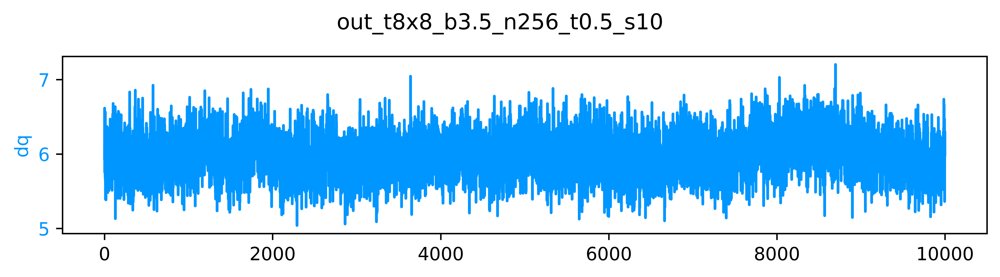

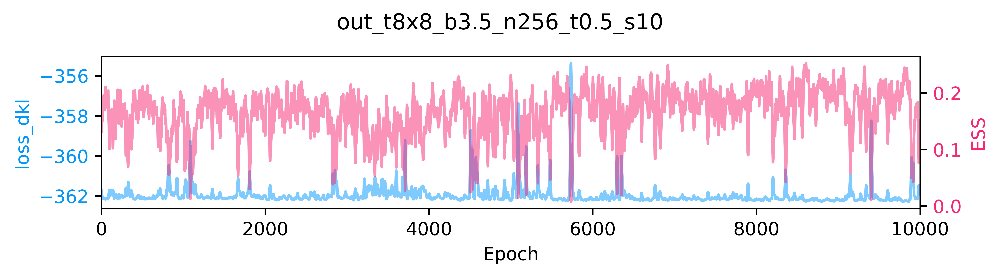

[06:36:36]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[06:36:53]  epoch=97.000 step=0.000 dt=0.132 loss=-361.929 dq=6.27363 ess=0.153293           
            plaq=0.833999 loss_dkl=-361.929 logp=186.816 logq=-175.113

[06:36:54]  ---------------------------------------                                          
            ERA=1, last took: 0 min 18.29 s                                                  
            ---------------------------------------

[06:37:08]  epoch=97.000 step=97.000 dt=0.133 loss=-362.083 dq=5.83145 ess=0.172285          
            plaq=0.833145 loss_dkl=-362.083 logp=186.624 logq=-175.459

[06:37:09]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.09 s                                                  
            ---------------------------------------

[06:37:23]  epoch=97.000 step=194.000 dt=0.132 loss=-361.966 dq=6.15488 ess=0.170914         
            plaq=0.830606 loss_dkl=-361.966 logp=186.056 logq=-175.91

[06:37:24]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.09 s                                                  
            ---------------------------------------

[06:37:38]  epoch=97.000 step=291.000 dt=0.133 loss=-362.11 dq=5.96191 ess=0.168705          
            plaq=0.831316 loss_dkl=-362.11 logp=186.215 logq=-175.896

[06:37:40]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.15 s                                                  
            ---------------------------------------

[06:37:53]  epoch=97.000 step=388.000 dt=0.133 loss=-362.088 dq=6.1582 ess=0.188938          
            plaq=0.833751 loss_dkl=-362.088 logp=186.76 logq=-175.327

[06:37:55]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.11 s                                                  
            ---------------------------------------

[06:38:08]  epoch=97.000 step=485.000 dt=0.133 loss=-362.125 dq=5.99687 ess=0.219654         
            plaq=0.834275 loss_dkl=-362.125 logp=186.878 logq=-175.247

[06:38:10]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.21 s                                                  
            ---------------------------------------

[06:38:23]  epoch=97.000 step=582.000 dt=0.132 loss=-361.821 dq=5.88672 ess=0.100644         
            plaq=0.832732 loss_dkl=-361.821 logp=186.532 logq=-175.289

[06:38:25]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.24 s                                                  
            ---------------------------------------

[06:38:39]  epoch=97.000 step=679.000 dt=0.133 loss=-362.075 dq=5.94883 ess=0.184265         
            plaq=0.831177 loss_dkl=-362.075 logp=186.184 logq=-175.891

[06:38:40]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.24 s                                                  
            ---------------------------------------

[06:38:54]  epoch=97.000 step=776.000 dt=0.133 loss=-361.681 dq=5.85059 ess=0.15315          
            plaq=0.833861 loss_dkl=-361.681 logp=186.785 logq=-174.896

[06:38:56]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.28 s                                                  
            ---------------------------------------

[06:39:09]  epoch=97.000 step=873.000 dt=0.133 loss=-361.816 dq=6.10449 ess=0.120684         
            plaq=0.832387 loss_dkl=-361.816 logp=186.455 logq=-175.361

[06:39:11]  ---------------------------------------                                          
            ERA=10, last took: 0 min 15.26 s                                                 
            ---------------------------------------

[06:39:24]  epoch=97.000 step=970.000 dt=0.133 loss=-359.398 dq=6.01875 ess=0.0203386        
            plaq=0.832432 loss_dkl=-359.398 logp=186.465 logq=-172.934

[06:39:26]  ---------------------------------------                                          
            ERA=11, last took: 0 min 15.24 s                                                 
            ---------------------------------------

[06:39:40]  epoch=97.000 step=1067.000 dt=0.133 loss=-362.102 dq=6.17891 ess=0.157666        
            plaq=0.83192 loss_dkl=-362.102 logp=186.35 logq=-175.752

[06:39:41]  ---------------------------------------                                          
            ERA=12, last took: 0 min 15.25 s                                                 
            ---------------------------------------

[06:39:55]  epoch=97.000 step=1164.000 dt=0.133 loss=-361.957 dq=6.04883 ess=0.157723        
            plaq=0.833234 loss_dkl=-361.957 logp=186.644 logq=-175.312

[06:39:57]  ---------------------------------------                                          
            ERA=13, last took: 0 min 15.25 s                                                 
            ---------------------------------------

[06:40:10]  epoch=97.000 step=1261.000 dt=0.133 loss=-362.136 dq=5.94121 ess=0.188657        
            plaq=0.833183 loss_dkl=-362.136 logp=186.633 logq=-175.503

[06:40:12]  ---------------------------------------                                          
            ERA=14, last took: 0 min 15.34 s                                                 
            ---------------------------------------

[06:40:25]  epoch=97.000 step=1358.000 dt=0.133 loss=-362.113 dq=5.93027 ess=0.174659        
            plaq=0.83351 loss_dkl=-362.113 logp=186.706 logq=-175.407

[06:40:27]  ---------------------------------------                                          
            ERA=15, last took: 0 min 15.37 s                                                 
            ---------------------------------------

[06:40:41]  epoch=97.000 step=1455.000 dt=0.133 loss=-362.069 dq=5.73438 ess=0.182013        
            plaq=0.833194 loss_dkl=-362.069 logp=186.635 logq=-175.434

[06:40:43]  ---------------------------------------                                          
            ERA=16, last took: 0 min 15.37 s                                                 
            ---------------------------------------

[06:40:56]  epoch=97.000 step=1552.000 dt=0.133 loss=-361.644 dq=5.97031 ess=0.0952321       
            plaq=0.833768 loss_dkl=-361.644 logp=186.764 logq=-174.88

[06:40:58]  ---------------------------------------                                          
            ERA=17, last took: 0 min 15.31 s                                                 
            ---------------------------------------

[06:41:12]  epoch=97.000 step=1649.000 dt=0.133 loss=-361.788 dq=6.33867 ess=0.124413        
            plaq=0.833037 loss_dkl=-361.788 logp=186.6 logq=-175.188

[06:41:13]  ---------------------------------------                                          
            ERA=18, last took: 0 min 15.32 s                                                 
            ---------------------------------------

[06:41:27]  epoch=97.000 step=1746.000 dt=0.133 loss=-362.078 dq=6.01895 ess=0.201487        
            plaq=0.833246 loss_dkl=-362.078 logp=186.647 logq=-175.431

[06:41:29]  ---------------------------------------                                          
            ERA=19, last took: 0 min 15.3 s                                                  
            ---------------------------------------

[06:41:42]  epoch=97.000 step=1843.000 dt=0.133 loss=-362.042 dq=6.00566 ess=0.171827        
            plaq=0.834098 loss_dkl=-362.042 logp=186.838 logq=-175.204

[06:41:44]  ---------------------------------------                                          
            ERA=20, last took: 0 min 15.38 s                                                 
            ---------------------------------------

[06:41:58]  epoch=97.000 step=1940.000 dt=0.133 loss=-362.085 dq=5.93145 ess=0.171227        
            plaq=0.833172 loss_dkl=-362.085 logp=186.631 logq=-175.454

[06:41:59]  ---------------------------------------                                          
            ERA=21, last took: 0 min 15.37 s                                                 
            ---------------------------------------

[06:42:13]  epoch=97.000 step=2037.000 dt=0.133 loss=-362.097 dq=6.07637 ess=0.178837        
            plaq=0.833869 loss_dkl=-362.097 logp=186.787 logq=-175.31

[06:42:15]  ---------------------------------------                                          
            ERA=22, last took: 0 min 15.95 s                                                 
            ---------------------------------------

[06:42:29]  epoch=97.000 step=2134.000 dt=0.133 loss=-362.007 dq=5.96309 ess=0.164709        
            plaq=0.836147 loss_dkl=-362.007 logp=187.297 logq=-174.71

[06:42:31]  ---------------------------------------                                          
            ERA=23, last took: 0 min 15.34 s                                                 
            ---------------------------------------

[06:42:44]  epoch=97.000 step=2231.000 dt=0.133 loss=-361.893 dq=5.64668 ess=0.142554        
            plaq=0.835537 loss_dkl=-361.893 logp=187.16 logq=-174.733

[06:42:46]  ---------------------------------------                                          
            ERA=24, last took: 0 min 15.34 s                                                 
            ---------------------------------------

[06:43:00]  epoch=97.000 step=2328.000 dt=0.133 loss=-361.815 dq=5.90859 ess=0.13817         
            plaq=0.831921 loss_dkl=-361.815 logp=186.35 logq=-175.465

[06:43:01]  ---------------------------------------                                          
            ERA=25, last took: 0 min 15.38 s                                                 
            ---------------------------------------

[06:43:15]  epoch=97.000 step=2425.000 dt=0.132 loss=-362.088 dq=6.05625 ess=0.172243        
            plaq=0.832747 loss_dkl=-362.088 logp=186.535 logq=-175.553

[06:43:17]  ---------------------------------------                                          
            ERA=26, last took: 0 min 15.4 s                                                  
            ---------------------------------------

[06:43:30]  epoch=97.000 step=2522.000 dt=0.133 loss=-362.086 dq=5.98496 ess=0.191309        
            plaq=0.833209 loss_dkl=-362.086 logp=186.639 logq=-175.447

[06:43:32]  ---------------------------------------                                          
            ERA=27, last took: 0 min 15.39 s                                                 
            ---------------------------------------

[06:43:46]  epoch=97.000 step=2619.000 dt=0.133 loss=-361.901 dq=5.89941 ess=0.12618         
            plaq=0.833755 loss_dkl=-361.901 logp=186.761 logq=-175.14

[06:43:48]  ---------------------------------------                                          
            ERA=28, last took: 0 min 15.38 s                                                 
            ---------------------------------------

[06:44:01]  epoch=97.000 step=2716.000 dt=0.133 loss=-362.089 dq=5.88652 ess=0.11707         
            plaq=0.83213 loss_dkl=-362.089 logp=186.397 logq=-175.692

[06:44:03]  ---------------------------------------                                          
            ERA=29, last took: 0 min 15.38 s                                                 
            ---------------------------------------

[06:44:16]  epoch=97.000 step=2813.000 dt=0.133 loss=-361.989 dq=5.93008 ess=0.159847        
            plaq=0.83189 loss_dkl=-361.989 logp=186.343 logq=-175.645

[06:44:18]  ---------------------------------------                                          
            ERA=30, last took: 0 min 15.43 s                                                 
            ---------------------------------------

[06:44:32]  epoch=97.000 step=2910.000 dt=0.133 loss=-362.044 dq=5.91309 ess=0.132515        
            plaq=0.833798 loss_dkl=-362.044 logp=186.771 logq=-175.273

[06:44:34]  ---------------------------------------                                          
            ERA=31, last took: 0 min 15.42 s                                                 
            ---------------------------------------

[06:44:47]  epoch=97.000 step=3007.000 dt=0.132 loss=-362.123 dq=5.88301 ess=0.174279        
            plaq=0.832552 loss_dkl=-362.123 logp=186.492 logq=-175.632

[06:44:49]  ---------------------------------------                                          
            ERA=32, last took: 0 min 15.39 s                                                 
            ---------------------------------------

[06:45:03]  epoch=97.000 step=3104.000 dt=0.133 loss=-361.167 dq=5.8707 ess=0.0663121        
            plaq=0.834602 loss_dkl=-361.167 logp=186.951 logq=-174.216

[06:45:05]  ---------------------------------------                                          
            ERA=33, last took: 0 min 15.39 s                                                 
            ---------------------------------------

[06:45:18]  epoch=97.000 step=3201.000 dt=0.133 loss=-361.989 dq=6.09746 ess=0.184404        
            plaq=0.835078 loss_dkl=-361.989 logp=187.057 logq=-174.932

[06:45:20]  ---------------------------------------                                          
            ERA=34, last took: 0 min 15.44 s                                                 
            ---------------------------------------

[06:45:34]  epoch=97.000 step=3298.000 dt=0.133 loss=-361.944 dq=6.01816 ess=0.130847        
            plaq=0.835597 loss_dkl=-361.944 logp=187.174 logq=-174.77

[06:45:35]  ---------------------------------------                                          
            ERA=35, last took: 0 min 15.44 s                                                 
            ---------------------------------------

[06:45:49]  epoch=97.000 step=3395.000 dt=0.133 loss=-361.977 dq=5.8666 ess=0.133812         
            plaq=0.834741 loss_dkl=-361.977 logp=186.982 logq=-174.996

[06:45:51]  ---------------------------------------                                          
            ERA=36, last took: 0 min 15.47 s                                                 
            ---------------------------------------

[06:46:04]  epoch=97.000 step=3492.000 dt=0.133 loss=-361.9 dq=5.77949 ess=0.0984168         
            plaq=0.833555 loss_dkl=-361.9 logp=186.716 logq=-175.184

[06:46:06]  ---------------------------------------                                          
            ERA=37, last took: 0 min 15.45 s                                                 
            ---------------------------------------

[06:46:20]  epoch=97.000 step=3589.000 dt=0.133 loss=-361.55 dq=5.93828 ess=0.122752         
            plaq=0.832 loss_dkl=-361.55 logp=186.368 logq=-175.182

[06:46:22]  ---------------------------------------                                          
            ERA=38, last took: 0 min 15.46 s                                                 
            ---------------------------------------

[06:46:35]  epoch=97.000 step=3686.000 dt=0.133 loss=-362.114 dq=6.15371 ess=0.16169         
            plaq=0.832548 loss_dkl=-362.114 logp=186.491 logq=-175.624

[06:46:37]  ---------------------------------------                                          
            ERA=39, last took: 0 min 15.48 s                                                 
            ---------------------------------------

[06:46:51]  epoch=97.000 step=3783.000 dt=0.133 loss=-362.053 dq=5.89785 ess=0.15537         
            plaq=0.832954 loss_dkl=-362.053 logp=186.582 logq=-175.471

[06:46:53]  ---------------------------------------                                          
            ERA=40, last took: 0 min 15.51 s                                                 
            ---------------------------------------

[06:47:06]  epoch=97.000 step=3880.000 dt=0.134 loss=-362.043 dq=5.77891 ess=0.14635         
            plaq=0.834393 loss_dkl=-362.043 logp=186.904 logq=-175.139

[06:47:08]  ---------------------------------------                                          
            ERA=41, last took: 0 min 15.47 s                                                 
            ---------------------------------------

[06:47:22]  epoch=97.000 step=3977.000 dt=0.133 loss=-361.941 dq=5.98477 ess=0.133822        
            plaq=0.836478 loss_dkl=-361.941 logp=187.371 logq=-174.57

[06:47:24]  ---------------------------------------                                          
            ERA=42, last took: 0 min 15.52 s                                                 
            ---------------------------------------

[06:47:37]  epoch=97.000 step=4074.000 dt=0.133 loss=-361.987 dq=6.18555 ess=0.184204        
            plaq=0.833158 loss_dkl=-361.987 logp=186.627 logq=-175.359

[06:47:39]  ---------------------------------------                                          
            ERA=43, last took: 0 min 15.52 s                                                 
            ---------------------------------------

[06:47:53]  epoch=97.000 step=4171.000 dt=0.133 loss=-362.203 dq=6.03105 ess=0.156459        
            plaq=0.834021 loss_dkl=-362.203 logp=186.821 logq=-175.382

[06:47:55]  ---------------------------------------                                          
            ERA=44, last took: 0 min 15.53 s                                                 
            ---------------------------------------

[06:48:08]  epoch=97.000 step=4268.000 dt=0.133 loss=-362.107 dq=5.89941 ess=0.172986        
            plaq=0.834373 loss_dkl=-362.107 logp=186.899 logq=-175.208

[06:48:10]  ---------------------------------------                                          
            ERA=45, last took: 0 min 15.56 s                                                 
            ---------------------------------------

[06:48:24]  epoch=97.000 step=4365.000 dt=0.133 loss=-360.698 dq=5.86172 ess=0.0382135       
            plaq=0.834593 loss_dkl=-360.698 logp=186.949 logq=-173.749

[06:48:26]  ---------------------------------------                                          
            ERA=46, last took: 0 min 15.55 s                                                 
            ---------------------------------------

[06:48:40]  epoch=97.000 step=4462.000 dt=0.133 loss=-362.12 dq=5.70195 ess=0.203391         
            plaq=0.833191 loss_dkl=-362.12 logp=186.635 logq=-175.485

[06:48:41]  ---------------------------------------                                          
            ERA=47, last took: 0 min 15.55 s                                                 
            ---------------------------------------

[06:48:55]  epoch=97.000 step=4559.000 dt=0.133 loss=-361.915 dq=6.02773 ess=0.150953        
            plaq=0.834346 loss_dkl=-361.915 logp=186.894 logq=-175.021

[06:48:57]  ---------------------------------------                                          
            ERA=48, last took: 0 min 15.55 s                                                 
            ---------------------------------------

[06:49:11]  epoch=97.000 step=4656.000 dt=0.133 loss=-362.212 dq=6.05801 ess=0.160233        
            plaq=0.833972 loss_dkl=-362.212 logp=186.81 logq=-175.403

[06:49:13]  ---------------------------------------                                          
            ERA=49, last took: 0 min 15.56 s                                                 
            ---------------------------------------

[06:49:26]  epoch=97.000 step=4753.000 dt=0.133 loss=-362.202 dq=6.2209 ess=0.190047         
            plaq=0.834532 loss_dkl=-362.202 logp=186.935 logq=-175.267

[06:49:28]  ---------------------------------------                                          
            ERA=50, last took: 0 min 15.61 s                                                 
            ---------------------------------------

[06:49:42]  epoch=97.000 step=4850.000 dt=0.133 loss=-354.54 dq=6.07441 ess=0.00793108       
            plaq=0.833517 loss_dkl=-354.54 logp=186.708 logq=-167.832

[06:49:44]  ---------------------------------------                                          
            ERA=51, last took: 0 min 15.56 s                                                 
            ---------------------------------------

[06:49:57]  epoch=97.000 step=4947.000 dt=0.133 loss=-359.372 dq=5.73047 ess=0.0136102       
            plaq=0.834698 loss_dkl=-359.372 logp=186.972 logq=-172.399

[06:49:59]  ---------------------------------------                                          
            ERA=52, last took: 0 min 15.59 s                                                 
            ---------------------------------------

[06:50:13]  epoch=97.000 step=5044.000 dt=0.136 loss=-362.071 dq=5.82246 ess=0.147604        
            plaq=0.83495 loss_dkl=-362.071 logp=187.029 logq=-175.042

[06:50:15]  ---------------------------------------                                          
            ERA=53, last took: 0 min 15.91 s                                                 
            ---------------------------------------

[06:50:29]  epoch=97.000 step=5141.000 dt=0.133 loss=-361.84 dq=5.86367 ess=0.108744         
            plaq=0.833777 loss_dkl=-361.84 logp=186.766 logq=-175.074

[06:50:31]  ---------------------------------------                                          
            ERA=54, last took: 0 min 15.58 s                                                 
            ---------------------------------------

[06:50:44]  epoch=97.000 step=5238.000 dt=0.134 loss=-362.048 dq=6.06387 ess=0.165611        
            plaq=0.834795 loss_dkl=-362.048 logp=186.994 logq=-175.055

[06:50:46]  ---------------------------------------                                          
            ERA=55, last took: 0 min 15.61 s                                                 
            ---------------------------------------

[06:51:00]  epoch=97.000 step=5335.000 dt=0.133 loss=-362.123 dq=6.16582 ess=0.189707        
            plaq=0.834291 loss_dkl=-362.123 logp=186.881 logq=-175.242

[06:51:02]  ---------------------------------------                                          
            ERA=56, last took: 0 min 15.79 s                                                 
            ---------------------------------------

[06:51:16]  epoch=97.000 step=5432.000 dt=0.133 loss=-362.231 dq=6.01133 ess=0.196333        
            plaq=0.832976 loss_dkl=-362.231 logp=186.587 logq=-175.645

[06:51:18]  ---------------------------------------                                          
            ERA=57, last took: 0 min 15.62 s                                                 
            ---------------------------------------

[06:51:31]  epoch=97.000 step=5529.000 dt=0.133 loss=-362.17 dq=5.93711 ess=0.147706         
            plaq=0.834789 loss_dkl=-362.17 logp=186.993 logq=-175.177

[06:51:33]  ---------------------------------------                                          
            ERA=58, last took: 0 min 15.61 s                                                 
            ---------------------------------------

[06:51:47]  epoch=97.000 step=5626.000 dt=0.133 loss=-362.215 dq=5.90195 ess=0.212206        
            plaq=0.834214 loss_dkl=-362.215 logp=186.864 logq=-175.352

[06:51:49]  ---------------------------------------                                          
            ERA=59, last took: 0 min 15.63 s                                                 
            ---------------------------------------

[06:52:03]  epoch=97.000 step=5723.000 dt=0.133 loss=-362.198 dq=5.48145 ess=0.219745        
            plaq=0.834295 loss_dkl=-362.198 logp=186.882 logq=-175.316

[06:52:06]  ---------------------------------------                                          
            ERA=60, last took: 0 min 16.69 s                                                 
            ---------------------------------------

[06:52:19]  epoch=97.000 step=5820.000 dt=0.133 loss=-362.123 dq=5.9125 ess=0.18541          
            plaq=0.833968 loss_dkl=-362.123 logp=186.809 logq=-175.314

[06:52:21]  ---------------------------------------                                          
            ERA=61, last took: 0 min 15.59 s                                                 
            ---------------------------------------

[06:52:35]  epoch=97.000 step=5917.000 dt=0.133 loss=-362.018 dq=6.01074 ess=0.204893        
            plaq=0.833359 loss_dkl=-362.018 logp=186.672 logq=-175.346

[06:52:37]  ---------------------------------------                                          
            ERA=62, last took: 0 min 15.63 s                                                 
            ---------------------------------------

[06:52:51]  epoch=97.000 step=6014.000 dt=0.133 loss=-361.033 dq=5.79004 ess=0.0551789       
            plaq=0.833658 loss_dkl=-361.033 logp=186.739 logq=-174.293

[06:52:53]  ---------------------------------------                                          
            ERA=63, last took: 0 min 15.61 s                                                 
            ---------------------------------------

[06:53:06]  epoch=97.000 step=6111.000 dt=0.133 loss=-361.875 dq=5.93516 ess=0.110173        
            plaq=0.833139 loss_dkl=-361.875 logp=186.623 logq=-175.251

[06:53:08]  ---------------------------------------                                          
            ERA=64, last took: 0 min 15.85 s                                                 
            ---------------------------------------

[06:53:22]  epoch=97.000 step=6208.000 dt=0.133 loss=-362.087 dq=6.03672 ess=0.148142        
            plaq=0.834247 loss_dkl=-362.087 logp=186.871 logq=-175.216

[06:53:24]  ---------------------------------------                                          
            ERA=65, last took: 0 min 15.62 s                                                 
            ---------------------------------------

[06:53:38]  epoch=97.000 step=6305.000 dt=0.133 loss=-362.06 dq=5.89121 ess=0.161823         
            plaq=0.832937 loss_dkl=-362.06 logp=186.578 logq=-175.482

[06:53:40]  ---------------------------------------                                          
            ERA=66, last took: 0 min 15.68 s                                                 
            ---------------------------------------

[06:53:53]  epoch=97.000 step=6402.000 dt=0.133 loss=-362.187 dq=5.90762 ess=0.179394        
            plaq=0.834749 loss_dkl=-362.187 logp=186.984 logq=-175.203

[06:53:55]  ---------------------------------------                                          
            ERA=67, last took: 0 min 15.69 s                                                 
            ---------------------------------------

[06:54:09]  epoch=97.000 step=6499.000 dt=0.132 loss=-362.166 dq=5.93848 ess=0.244567        
            plaq=0.834054 loss_dkl=-362.166 logp=186.828 logq=-175.338

[06:54:11]  ---------------------------------------                                          
            ERA=68, last took: 0 min 15.9 s                                                  
            ---------------------------------------

[06:54:25]  epoch=97.000 step=6596.000 dt=0.133 loss=-362.135 dq=6.03613 ess=0.156124        
            plaq=0.83385 loss_dkl=-362.135 logp=186.782 logq=-175.353

[06:54:27]  ---------------------------------------                                          
            ERA=69, last took: 0 min 15.66 s                                                 
            ---------------------------------------

[06:54:41]  epoch=97.000 step=6693.000 dt=0.133 loss=-362.135 dq=5.90703 ess=0.138168        
            plaq=0.833275 loss_dkl=-362.135 logp=186.654 logq=-175.482

[06:54:43]  ---------------------------------------                                          
            ERA=70, last took: 0 min 15.7 s                                                  
            ---------------------------------------

[06:54:56]  epoch=97.000 step=6790.000 dt=0.133 loss=-362.02 dq=5.98086 ess=0.162603         
            plaq=0.832879 loss_dkl=-362.02 logp=186.565 logq=-175.455

[06:54:58]  ---------------------------------------                                          
            ERA=71, last took: 0 min 15.69 s                                                 
            ---------------------------------------

[06:55:12]  epoch=97.000 step=6887.000 dt=0.133 loss=-362.149 dq=5.73145 ess=0.168002        
            plaq=0.835267 loss_dkl=-362.149 logp=187.1 logq=-175.049

[06:55:14]  ---------------------------------------                                          
            ERA=72, last took: 0 min 15.69 s                                                 
            ---------------------------------------

[06:55:28]  epoch=97.000 step=6984.000 dt=0.133 loss=-362.138 dq=5.92852 ess=0.158437        
            plaq=0.834344 loss_dkl=-362.138 logp=186.893 logq=-175.246

[06:55:30]  ---------------------------------------                                          
            ERA=73, last took: 0 min 15.7 s                                                  
            ---------------------------------------

[06:55:43]  epoch=97.000 step=7081.000 dt=0.133 loss=-362.183 dq=5.66055 ess=0.181681        
            plaq=0.835842 loss_dkl=-362.183 logp=187.229 logq=-174.954

[06:55:46]  ---------------------------------------                                          
            ERA=74, last took: 0 min 15.72 s                                                 
            ---------------------------------------

[06:55:59]  epoch=97.000 step=7178.000 dt=0.133 loss=-362.053 dq=5.95 ess=0.143551           
            plaq=0.834719 loss_dkl=-362.053 logp=186.977 logq=-175.076

[06:56:01]  ---------------------------------------                                          
            ERA=75, last took: 0 min 15.72 s                                                 
            ---------------------------------------

[06:56:15]  epoch=97.000 step=7275.000 dt=0.133 loss=-362.122 dq=6.19297 ess=0.118542        
            plaq=0.833429 loss_dkl=-362.122 logp=186.688 logq=-175.434

[06:56:17]  ---------------------------------------                                          
            ERA=76, last took: 0 min 15.78 s                                                 
            ---------------------------------------

[06:56:31]  epoch=97.000 step=7372.000 dt=0.133 loss=-362.158 dq=6.22285 ess=0.157977        
            plaq=0.836449 loss_dkl=-362.158 logp=187.364 logq=-174.794

[06:56:33]  ---------------------------------------                                          
            ERA=77, last took: 0 min 15.8 s                                                  
            ---------------------------------------

[06:56:46]  epoch=97.000 step=7469.000 dt=0.133 loss=-362.062 dq=6.31055 ess=0.196248        
            plaq=0.836447 loss_dkl=-362.062 logp=187.364 logq=-174.698

[06:56:49]  ---------------------------------------                                          
            ERA=78, last took: 0 min 15.76 s                                                 
            ---------------------------------------

[06:57:02]  epoch=97.000 step=7566.000 dt=0.135 loss=-362.074 dq=6.20273 ess=0.166841        
            plaq=0.834354 loss_dkl=-362.074 logp=186.895 logq=-175.179

[06:57:04]  ---------------------------------------                                          
            ERA=79, last took: 0 min 15.77 s                                                 
            ---------------------------------------

[06:57:18]  epoch=97.000 step=7663.000 dt=0.133 loss=-362.239 dq=6.02559 ess=0.227824        
            plaq=0.834506 loss_dkl=-362.239 logp=186.929 logq=-175.31

[06:57:20]  ---------------------------------------                                          
            ERA=80, last took: 0 min 15.8 s                                                  
            ---------------------------------------

[06:57:34]  epoch=97.000 step=7760.000 dt=0.133 loss=-362.236 dq=6.11211 ess=0.198579        
            plaq=0.833967 loss_dkl=-362.236 logp=186.809 logq=-175.428

[06:57:36]  ---------------------------------------                                          
            ERA=81, last took: 0 min 15.76 s                                                 
            ---------------------------------------

[06:57:50]  epoch=97.000 step=7857.000 dt=0.133 loss=-362.144 dq=6.1918 ess=0.185182         
            plaq=0.832723 loss_dkl=-362.144 logp=186.53 logq=-175.614

[06:57:52]  ---------------------------------------                                          
            ERA=82, last took: 0 min 15.74 s                                                 
            ---------------------------------------

[06:58:05]  epoch=97.000 step=7954.000 dt=0.133 loss=-362.201 dq=6.17148 ess=0.201282        
            plaq=0.832845 loss_dkl=-362.201 logp=186.557 logq=-175.643

[06:58:07]  ---------------------------------------                                          
            ERA=83, last took: 0 min 15.75 s                                                 
            ---------------------------------------

[06:58:21]  epoch=97.000 step=8051.000 dt=0.133 loss=-362.061 dq=6.07539 ess=0.17623         
            plaq=0.832123 loss_dkl=-362.061 logp=186.395 logq=-175.666

[06:58:23]  ---------------------------------------                                          
            ERA=84, last took: 0 min 15.79 s                                                 
            ---------------------------------------

[06:58:37]  epoch=97.000 step=8148.000 dt=0.133 loss=-362.182 dq=6.04199 ess=0.238793        
            plaq=0.832284 loss_dkl=-362.182 logp=186.432 logq=-175.75

[06:58:39]  ---------------------------------------                                          
            ERA=85, last took: 0 min 15.8 s                                                  
            ---------------------------------------

[06:58:53]  epoch=97.000 step=8245.000 dt=0.133 loss=-362.198 dq=6.22227 ess=0.24417         
            plaq=0.833585 loss_dkl=-362.198 logp=186.723 logq=-175.475

[06:58:55]  ---------------------------------------                                          
            ERA=86, last took: 0 min 15.82 s                                                 
            ---------------------------------------

[06:59:08]  epoch=97.000 step=8342.000 dt=0.133 loss=-362.122 dq=6.45215 ess=0.197841        
            plaq=0.834337 loss_dkl=-362.122 logp=186.891 logq=-175.23

[06:59:11]  ---------------------------------------                                          
            ERA=87, last took: 0 min 15.79 s                                                 
            ---------------------------------------

[06:59:24]  epoch=97.000 step=8439.000 dt=0.134 loss=-362.252 dq=6.10195 ess=0.243988        
            plaq=0.832653 loss_dkl=-362.252 logp=186.514 logq=-175.738

[06:59:26]  ---------------------------------------                                          
            ERA=88, last took: 0 min 15.82 s                                                 
            ---------------------------------------

[06:59:40]  epoch=97.000 step=8536.000 dt=0.133 loss=-362.21 dq=5.71055 ess=0.184202         
            plaq=0.834035 loss_dkl=-362.21 logp=186.824 logq=-175.386

[06:59:42]  ---------------------------------------                                          
            ERA=89, last took: 0 min 15.81 s                                                 
            ---------------------------------------

[06:59:56]  epoch=97.000 step=8633.000 dt=0.133 loss=-362.141 dq=6.03418 ess=0.208007        
            plaq=0.833936 loss_dkl=-362.141 logp=186.802 logq=-175.339

[06:59:58]  ---------------------------------------                                          
            ERA=90, last took: 0 min 15.81 s                                                 
            ---------------------------------------

[07:00:12]  epoch=97.000 step=8730.000 dt=0.133 loss=-361.988 dq=6.12988 ess=0.107226        
            plaq=0.833763 loss_dkl=-361.988 logp=186.763 logq=-175.225

[07:00:14]  ---------------------------------------                                          
            ERA=91, last took: 0 min 15.81 s                                                 
            ---------------------------------------

[07:00:27]  epoch=97.000 step=8827.000 dt=0.133 loss=-362.09 dq=6.02012 ess=0.172813         
            plaq=0.834328 loss_dkl=-362.09 logp=186.889 logq=-175.201

[07:00:30]  ---------------------------------------                                          
            ERA=92, last took: 0 min 15.83 s                                                 
            ---------------------------------------

[07:00:43]  epoch=97.000 step=8924.000 dt=0.133 loss=-362.213 dq=5.98066 ess=0.205848        
            plaq=0.834615 loss_dkl=-362.213 logp=186.954 logq=-175.26

[07:00:46]  ---------------------------------------                                          
            ERA=93, last took: 0 min 15.83 s                                                 
            ---------------------------------------

[07:00:59]  epoch=97.000 step=9021.000 dt=0.133 loss=-362.081 dq=5.92129 ess=0.184918        
            plaq=0.833827 loss_dkl=-362.081 logp=186.777 logq=-175.304

[07:01:01]  ---------------------------------------                                          
            ERA=94, last took: 0 min 15.82 s                                                 
            ---------------------------------------

[07:01:15]  epoch=97.000 step=9118.000 dt=0.133 loss=-362.179 dq=5.9541 ess=0.226841         
            plaq=0.834561 loss_dkl=-362.179 logp=186.942 logq=-175.237

[07:01:17]  ---------------------------------------                                          
            ERA=95, last took: 0 min 15.83 s                                                 
            ---------------------------------------

[07:01:31]  epoch=97.000 step=9215.000 dt=0.133 loss=-362.19 dq=6.02676 ess=0.185122         
            plaq=0.83609 loss_dkl=-362.19 logp=187.284 logq=-174.906

[07:01:33]  ---------------------------------------                                          
            ERA=96, last took: 0 min 15.9 s                                                  
            ---------------------------------------

[07:01:47]  epoch=97.000 step=9312.000 dt=0.133 loss=-362.038 dq=5.83613 ess=0.121915        
            plaq=0.83304 loss_dkl=-362.038 logp=186.601 logq=-175.437

[07:01:49]  ---------------------------------------                                          
            ERA=97, last took: 0 min 15.86 s                                                 
            ---------------------------------------

[07:02:03]  epoch=97.000 step=9409.000 dt=0.133 loss=-362.301 dq=5.67559 ess=0.208579        
            plaq=0.8351 loss_dkl=-362.301 logp=187.062 logq=-175.239

[07:02:05]  ---------------------------------------                                          
            ERA=98, last took: 0 min 15.91 s                                                 
            ---------------------------------------

[07:02:18]  epoch=97.000 step=9506.000 dt=0.133 loss=-360.59 dq=5.9252 ess=0.0827815         
            plaq=0.835631 loss_dkl=-360.59 logp=187.181 logq=-173.408

[07:02:21]  ---------------------------------------                                          
            ERA=99, last took: 0 min 15.85 s                                                 
            ---------------------------------------

[07:02:34]  epoch=97.000 step=9603.000 dt=0.133 loss=-361.474 dq=5.91895 ess=0.0635602       
            plaq=0.835642 loss_dkl=-361.474 logp=187.184 logq=-174.291

[07:02:37]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n
            256_t0.5_s10/models/pre_flow_model/2021-05-29-0447/pre_flow_model.tar

[07:02:40]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n2
            56_t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/dq_training_070240.pdf

[07:02:40]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/dq_training_070240.pdf

[07:02:40]  Existing file found!                                                             
            Renaming outfile to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n2
            56_t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/loss_dkl_ess_training_0
            70240.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/loss_dkl_ess_training_0702
            40.pdf

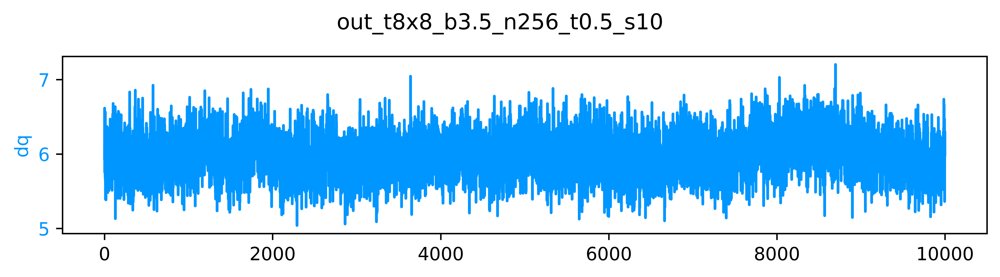

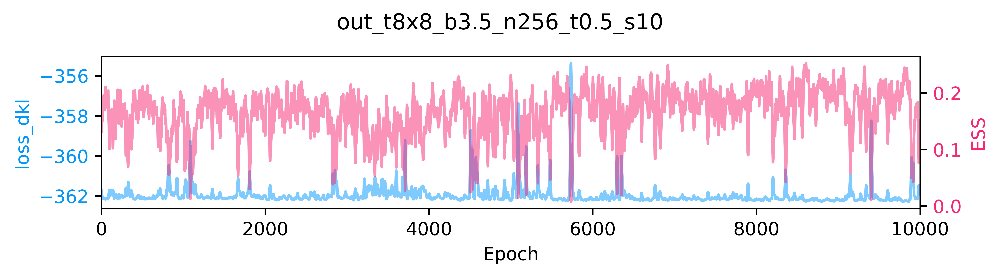

In [27]:
train_outputs = train(param,
                      train_config,
                      model=train_outputs['model'],
                      pre_model=None,
                      logger=logger,
                      figsize=(7.5, 2))
 
pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']

pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer_kdl']

step = train_config.n_era * train_config.n_epoch
outfile = os.path.join(MODEL_DIR, 'pre_flow_model', TSTAMP, 'pre_flow_model.tar')

io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=train_outputs['model']['layers'],
    optimizer=pre_flow_optimizer,
    history=train_outputs['history'],
    overwrite=True,
)

plots = train_outputs['plots']
outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)

save_live_plots(plots, outdir)

[05:16:59]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-29-051659

[05:16:59]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n25
            6_t0.5_s10/metrics/training/pre_flow_model/2021-05-29-0447

[05:16:59]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/step.pdf

[05:17:00]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/dt.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/loss.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/dq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/plaq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/loss_dkl.pdf

[05:17:01]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0_n256_
            t0.5_s10/plots/training/pre_flow_model/2021-05-29-0447/logq.pdf

[05:17:01]  Saving train_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b3.0
            _n256_t0.5_s10/metrics/training/pre_flow_model/2021-05-29-0447/train_metrics.z.

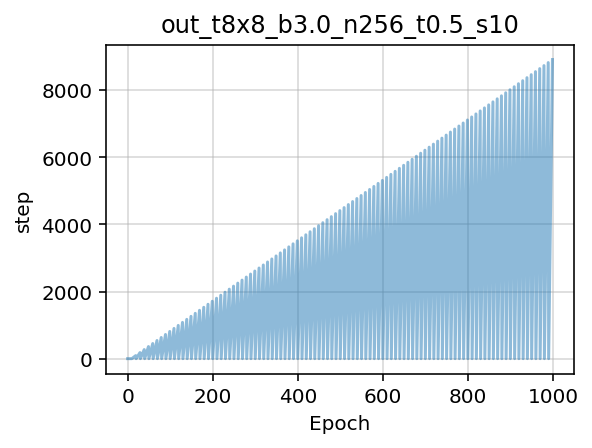

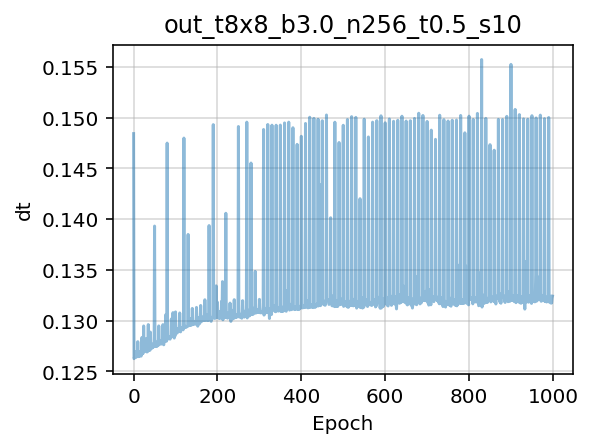

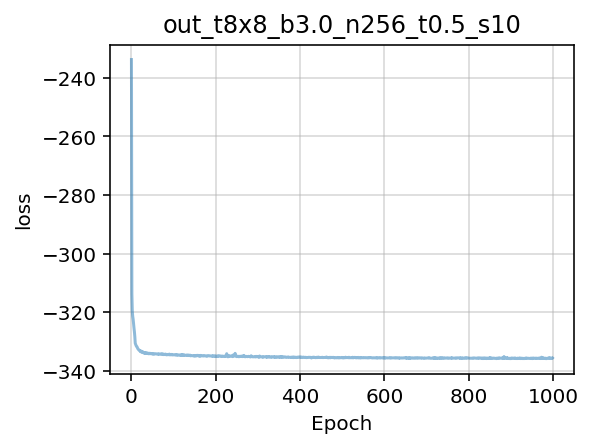

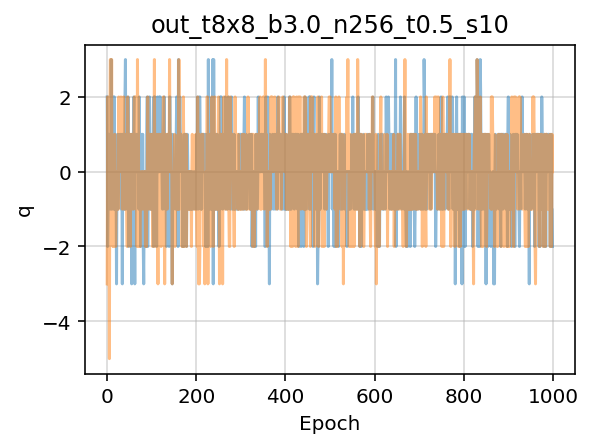

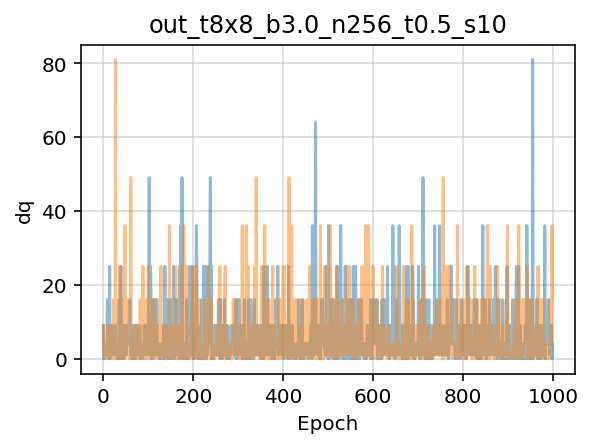

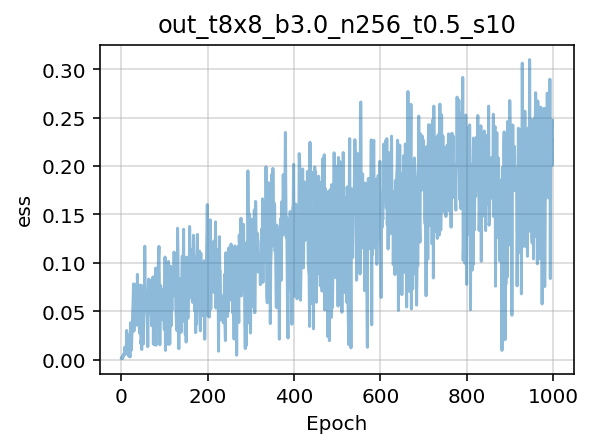

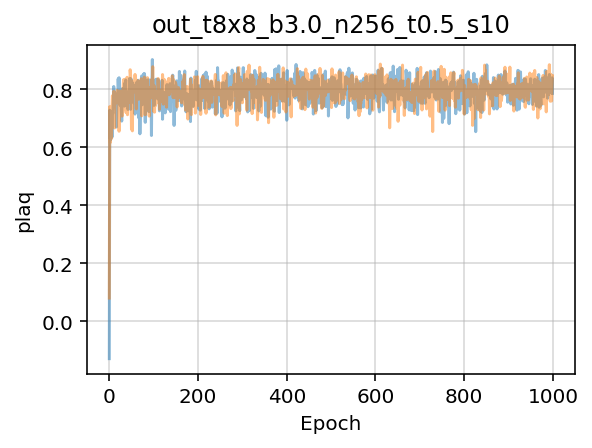

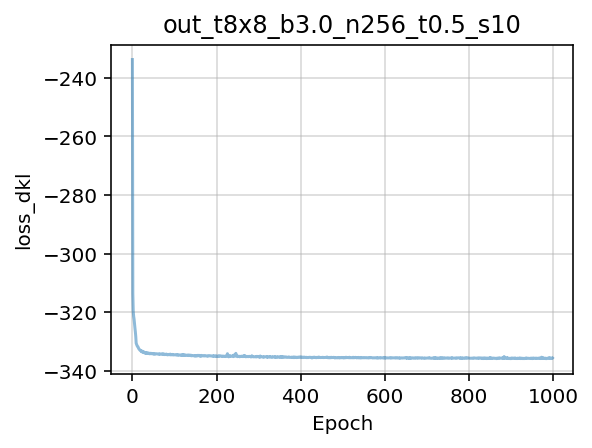

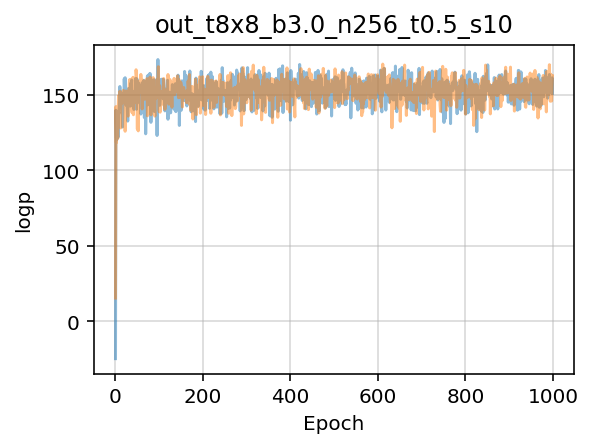

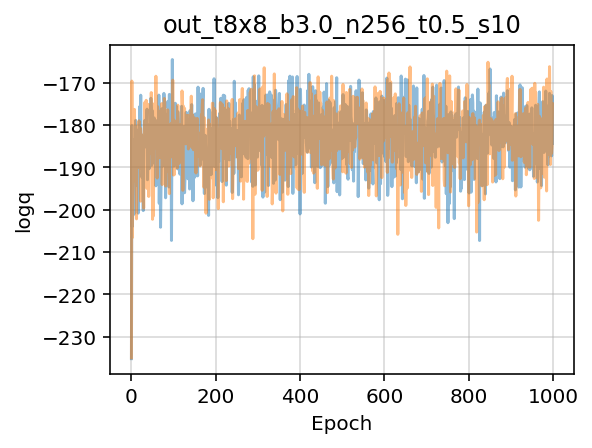

In [21]:
from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

## Run inference on trained model and plot history

[16:50:31]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621

[16:50:31]  Creating directory:                                                              
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_t0.5_s10/plots/   
            inference/pre_flow_model/2021-05-25-1621

[16:50:31]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/dqsq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/dkl.pdf

[16:50:32]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/logq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_
            t0.5_s10/plots/inference/pre_flow_model/2021-05-25-1621/accepted.pdf

[16:50:32]  Saving inference_metrics to                                                      
            /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t8x8_b2.0_n256_t0.5_s10/plots/   
            inference/pre_flow_model/2021-05-25-1621/inference_metrics.z.

[16:50:32]  Accept rate: 0.4657

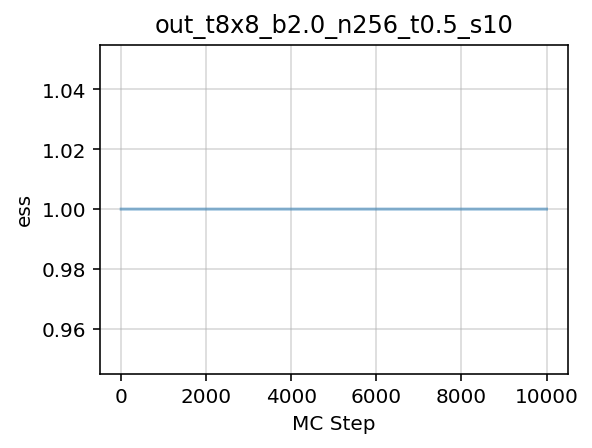

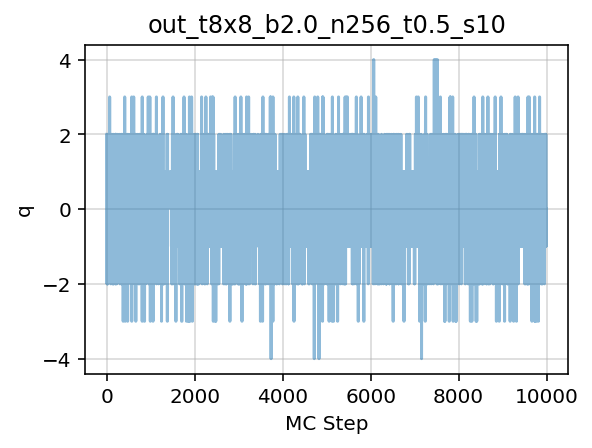

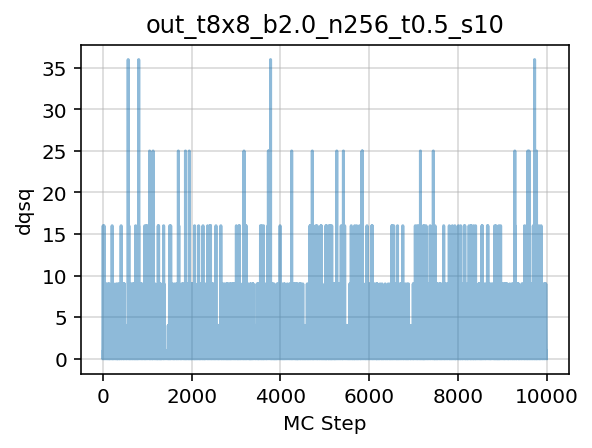

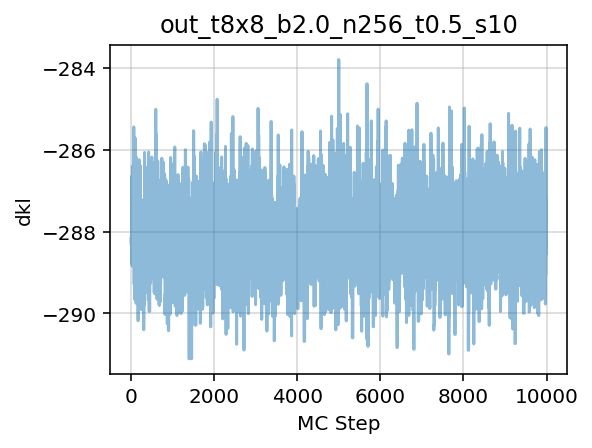

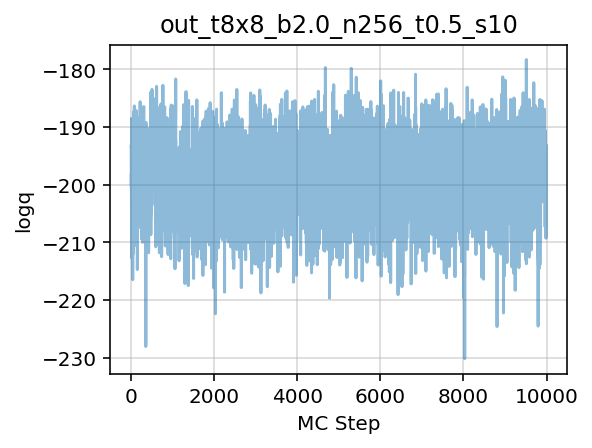

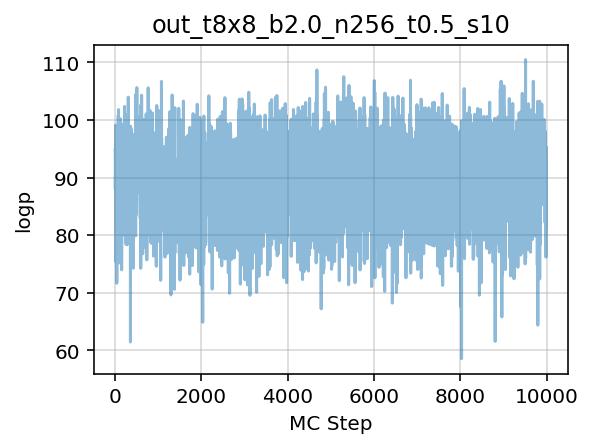

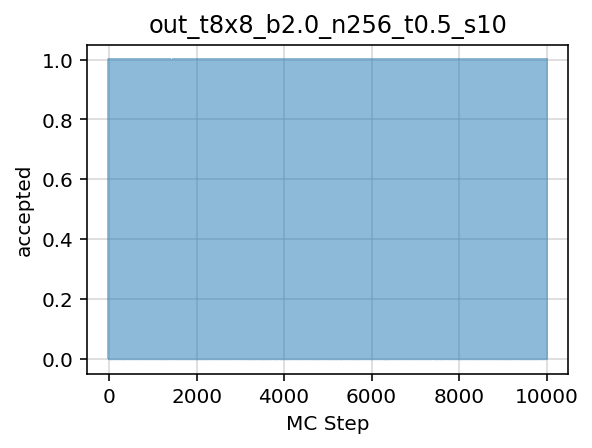

In [8]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=10000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [9]:
np.mean(history['accepted'])

0.4657

In [11]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)
u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

[16:53:32]  accept_rate=0.4296875

            top_susceptibility=1.22700 +/- 0.10610

In [12]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

[16:53:42]  accept_rate=0.4755859375

            top_susceptibility=1.62949 +/- 0.22365

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

In [13]:
logger.log(repr(param))

[16:54:02]  Param:                                                                           
            ----------------                                                                 
            beta=2.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.05

In [14]:
logger.log(train_config)

[16:54:47]  TrainConfig(                                                                     
                n_era=10,                                                                    
                n_epoch=1000,                                                                
                n_layers=24,                                                                 
                n_s_nets=2,                                                                  
                hidden_sizes=[8, 8],                                                         
                kernel_size=3,                                                               
                base_lr=0.001,                                                               
                batch_size=256,                                                              
                print_freq=100,                                                              
                plot_freq=100,                                                               
                with_force=False                                                             
            )

In [18]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

[17:10:40]  Param:                                                                           
            ----------------                                                                 
            beta=2.0                                                                         
            L=12                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=True                                                                    
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[12, 12]                                                                     
            nd=2                                                                             
            shape=[2, 12, 12]                                                                
            volume=144                                                                       
            dt=0.05

In [19]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

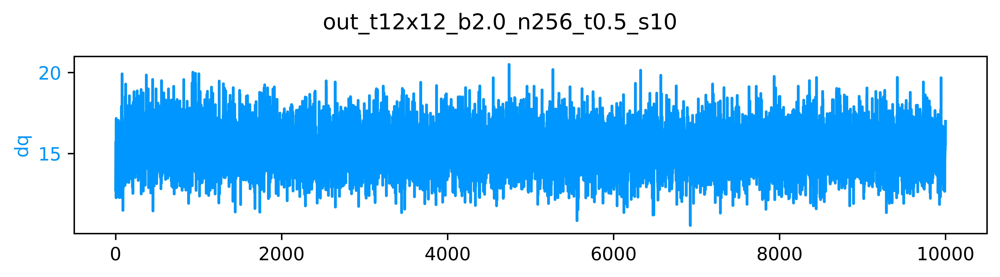

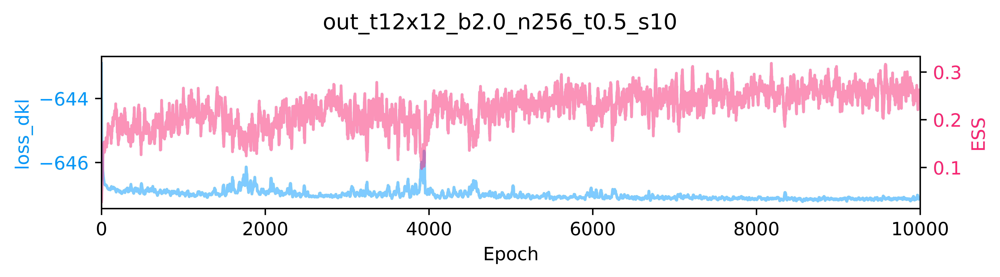

[17:10:51]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:11:04]  epoch=97.000 step=0.000 dt=0.127 loss=-646.856 dq=14.6242 ess=0.177524           
            plaq=0.693464 loss_dkl=-646.856 logp=199.718 logq=-447.139

[17:11:18]  epoch=197.000 step=0.000 dt=0.125 loss=-646.862 dq=15.3422 ess=0.23624           
            plaq=0.69252 loss_dkl=-646.862 logp=199.446 logq=-447.416

[17:11:33]  epoch=297.000 step=0.000 dt=0.126 loss=-646.939 dq=15.7219 ess=0.186825          
            plaq=0.689036 loss_dkl=-646.939 logp=198.442 logq=-448.497

[17:11:47]  epoch=397.000 step=0.000 dt=0.126 loss=-647.029 dq=15.1258 ess=0.171255          
            plaq=0.691575 loss_dkl=-647.029 logp=199.174 logq=-447.855

[17:12:02]  epoch=497.000 step=0.000 dt=0.126 loss=-646.672 dq=14.0672 ess=0.145551          
            plaq=0.685751 loss_dkl=-646.672 logp=197.496 logq=-449.176

[17:12:16]  epoch=597.000 step=0.000 dt=0.127 loss=-646.837 dq=16.55 ess=0.121838            
            plaq=0.688182 loss_dkl=-646.837 logp=198.196 logq=-448.641

[17:12:30]  epoch=697.000 step=0.000 dt=0.126 loss=-647.018 dq=15.7625 ess=0.165266          
            plaq=0.687184 loss_dkl=-647.018 logp=197.909 logq=-449.109

[17:12:45]  epoch=797.000 step=0.000 dt=0.126 loss=-646.901 dq=15.2367 ess=0.18746           
            plaq=0.689819 loss_dkl=-646.901 logp=198.668 logq=-448.233

[17:12:59]  epoch=897.000 step=0.000 dt=0.126 loss=-647.027 dq=14.8125 ess=0.2 plaq=0.688745 
            loss_dkl=-647.027 logp=198.358 logq=-448.668

[17:13:14]  epoch=997.000 step=0.000 dt=0.126 loss=-646.906 dq=15.5453 ess=0.155303          
            plaq=0.687729 loss_dkl=-646.906 logp=198.066 logq=-448.84

[17:13:16]  ---------------------------------------                                          
            ERA=1, last took: 2 min 24.4 s                                                   
            ---------------------------------------

[17:13:28]  epoch=97.000 step=97.000 dt=0.126 loss=-646.969 dq=15.3648 ess=0.266596          
            plaq=0.687483 loss_dkl=-646.969 logp=197.995 logq=-448.973

[17:13:43]  epoch=197.000 step=197.000 dt=0.126 loss=-646.942 dq=14.4187 ess=0.185238        
            plaq=0.691749 loss_dkl=-646.942 logp=199.224 logq=-447.718

[17:13:57]  epoch=297.000 step=297.000 dt=0.126 loss=-647.083 dq=16.5039 ess=0.211816        
            plaq=0.691888 loss_dkl=-647.083 logp=199.264 logq=-447.819

[17:14:12]  epoch=397.000 step=397.000 dt=0.127 loss=-646.948 dq=15.8297 ess=0.193754        
            plaq=0.688924 loss_dkl=-646.948 logp=198.41 logq=-448.538

[17:14:27]  epoch=497.000 step=497.000 dt=0.126 loss=-646.612 dq=16.0305 ess=0.145847        
            plaq=0.691034 loss_dkl=-646.612 logp=199.018 logq=-447.594

[17:14:41]  epoch=597.000 step=597.000 dt=0.126 loss=-646.852 dq=15.8461 ess=0.211879        
            plaq=0.692453 loss_dkl=-646.852 logp=199.426 logq=-447.425

[17:14:56]  epoch=697.000 step=697.000 dt=0.127 loss=-646.58 dq=15.2445 ess=0.126755         
            plaq=0.687685 loss_dkl=-646.58 logp=198.053 logq=-448.527

[17:15:10]  epoch=797.000 step=797.000 dt=0.127 loss=-646.86 dq=16.1547 ess=0.152159         
            plaq=0.687034 loss_dkl=-646.86 logp=197.866 logq=-448.995

[17:15:25]  epoch=897.000 step=897.000 dt=0.127 loss=-646.707 dq=16.5648 ess=0.101888        
            plaq=0.688757 loss_dkl=-646.707 logp=198.362 logq=-448.345

[17:15:40]  epoch=997.000 step=997.000 dt=0.129 loss=-646.933 dq=15.6109 ess=0.196349        
            plaq=0.687418 loss_dkl=-646.933 logp=197.977 logq=-448.956

[17:15:42]  ---------------------------------------                                          
            ERA=2, last took: 2 min 26.07 s                                                  
            ---------------------------------------

[17:15:55]  epoch=97.000 step=194.000 dt=0.130 loss=-646.885 dq=15.5219 ess=0.162463         
            plaq=0.690474 loss_dkl=-646.885 logp=198.857 logq=-448.028

[17:16:10]  epoch=197.000 step=394.000 dt=0.131 loss=-646.98 dq=16.2422 ess=0.173546         
            plaq=0.685715 loss_dkl=-646.98 logp=197.486 logq=-449.494

[17:16:25]  epoch=297.000 step=594.000 dt=0.126 loss=-646.961 dq=15.9688 ess=0.219782        
            plaq=0.688138 loss_dkl=-646.961 logp=198.184 logq=-448.777

[17:16:40]  epoch=397.000 step=794.000 dt=0.132 loss=-647.03 dq=16.193 ess=0.211795          
            plaq=0.685561 loss_dkl=-647.03 logp=197.442 logq=-449.589

[17:16:55]  epoch=497.000 step=994.000 dt=0.141 loss=-647.013 dq=14.9617 ess=0.229755        
            plaq=0.689209 loss_dkl=-647.013 logp=198.492 logq=-448.521

[17:17:11]  epoch=597.000 step=1194.000 dt=0.126 loss=-647.049 dq=15.4187 ess=0.185496       
            plaq=0.69137 loss_dkl=-647.049 logp=199.115 logq=-447.935

[17:17:26]  epoch=697.000 step=1394.000 dt=0.128 loss=-647.031 dq=14.0102 ess=0.173825       
            plaq=0.690013 loss_dkl=-647.031 logp=198.724 logq=-448.307

[17:17:40]  epoch=797.000 step=1594.000 dt=0.128 loss=-647.061 dq=15.0898 ess=0.219352       
            plaq=0.688896 loss_dkl=-647.061 logp=198.402 logq=-448.659

[17:17:55]  epoch=897.000 step=1794.000 dt=0.129 loss=-647.128 dq=15.4742 ess=0.226814       
            plaq=0.689284 loss_dkl=-647.128 logp=198.514 logq=-448.614

[17:18:10]  epoch=997.000 step=1994.000 dt=0.128 loss=-647.058 dq=16.4344 ess=0.249416       
            plaq=0.689198 loss_dkl=-647.058 logp=198.489 logq=-448.569

[17:18:12]  ---------------------------------------                                          
            ERA=3, last took: 2 min 30.46 s                                                  
            ---------------------------------------

[17:18:25]  epoch=97.000 step=291.000 dt=0.129 loss=-647.003 dq=15.7508 ess=0.264785         
            plaq=0.686715 loss_dkl=-647.003 logp=197.774 logq=-449.229

[17:18:40]  epoch=197.000 step=591.000 dt=0.128 loss=-646.998 dq=16.0586 ess=0.221443        
            plaq=0.687429 loss_dkl=-646.998 logp=197.98 logq=-449.018

[17:18:55]  epoch=297.000 step=891.000 dt=0.128 loss=-647.048 dq=15.8227 ess=0.238786        
            plaq=0.692521 loss_dkl=-647.048 logp=199.446 logq=-447.602

[17:19:10]  epoch=397.000 step=1191.000 dt=0.129 loss=-646.878 dq=15.9219 ess=0.172722       
            plaq=0.689522 loss_dkl=-646.878 logp=198.582 logq=-448.296

[17:19:25]  epoch=497.000 step=1491.000 dt=0.129 loss=-646.885 dq=15.6422 ess=0.198631       
            plaq=0.690193 loss_dkl=-646.885 logp=198.776 logq=-448.11

[17:19:40]  epoch=597.000 step=1791.000 dt=0.129 loss=-647.035 dq=15.9578 ess=0.228774       
            plaq=0.689279 loss_dkl=-647.035 logp=198.512 logq=-448.522

[17:19:55]  epoch=697.000 step=2091.000 dt=0.129 loss=-647.106 dq=15.1156 ess=0.226101       
            plaq=0.686467 loss_dkl=-647.106 logp=197.702 logq=-449.404

[17:20:10]  epoch=797.000 step=2391.000 dt=0.129 loss=-646.81 dq=15.8461 ess=0.167077        
            plaq=0.690862 loss_dkl=-646.81 logp=198.968 logq=-447.841

[17:20:25]  epoch=897.000 step=2691.000 dt=0.130 loss=-646.75 dq=15.8344 ess=0.143895        
            plaq=0.690473 loss_dkl=-646.75 logp=198.856 logq=-447.894

[17:20:40]  epoch=997.000 step=2991.000 dt=0.129 loss=-646.916 dq=15.2688 ess=0.141949       
            plaq=0.688218 loss_dkl=-646.916 logp=198.207 logq=-448.709

[17:20:42]  ---------------------------------------                                          
            ERA=4, last took: 2 min 29.65 s                                                  
            ---------------------------------------

[17:20:55]  epoch=97.000 step=388.000 dt=0.129 loss=-647.066 dq=15.2258 ess=0.244283         
            plaq=0.693583 loss_dkl=-647.066 logp=199.752 logq=-447.314

[17:21:10]  epoch=197.000 step=788.000 dt=0.129 loss=-647.099 dq=15.2305 ess=0.183414        
            plaq=0.687758 loss_dkl=-647.099 logp=198.074 logq=-449.025

[17:21:25]  epoch=297.000 step=1188.000 dt=0.129 loss=-647.019 dq=15.1219 ess=0.211485       
            plaq=0.689591 loss_dkl=-647.019 logp=198.602 logq=-448.417

[17:21:40]  epoch=397.000 step=1588.000 dt=0.129 loss=-646.829 dq=14.4555 ess=0.170231       
            plaq=0.687629 loss_dkl=-646.829 logp=198.037 logq=-448.792

[17:21:55]  epoch=497.000 step=1988.000 dt=0.129 loss=-646.842 dq=15.5758 ess=0.151192       
            plaq=0.690413 loss_dkl=-646.842 logp=198.839 logq=-448.003

[17:22:10]  epoch=597.000 step=2388.000 dt=0.129 loss=-646.893 dq=14.5422 ess=0.158195       
            plaq=0.690726 loss_dkl=-646.893 logp=198.929 logq=-447.964

[17:22:25]  epoch=697.000 step=2788.000 dt=0.129 loss=-646.879 dq=16.3172 ess=0.203067       
            plaq=0.689172 loss_dkl=-646.879 logp=198.482 logq=-448.398

[17:22:40]  epoch=797.000 step=3188.000 dt=0.129 loss=-646.994 dq=15.1398 ess=0.219144       
            plaq=0.69026 loss_dkl=-646.994 logp=198.795 logq=-448.199

[17:22:55]  epoch=897.000 step=3588.000 dt=0.129 loss=-647.019 dq=14.3719 ess=0.276529       
            plaq=0.686933 loss_dkl=-647.019 logp=197.837 logq=-449.182

[17:23:10]  epoch=997.000 step=3988.000 dt=0.129 loss=-647.06 dq=15.3023 ess=0.220107        
            plaq=0.687431 loss_dkl=-647.06 logp=197.98 logq=-449.08

[17:23:12]  ---------------------------------------                                          
            ERA=5, last took: 2 min 30.33 s                                                  
            ---------------------------------------

[17:23:25]  epoch=97.000 step=485.000 dt=0.129 loss=-647.123 dq=14.7922 ess=0.272277         
            plaq=0.689997 loss_dkl=-647.123 logp=198.719 logq=-448.404

[17:23:40]  epoch=197.000 step=985.000 dt=0.129 loss=-647.102 dq=15.4617 ess=0.215788        
            plaq=0.688359 loss_dkl=-647.102 logp=198.247 logq=-448.854

[17:23:55]  epoch=297.000 step=1485.000 dt=0.129 loss=-647.123 dq=14.4641 ess=0.228809       
            plaq=0.690881 loss_dkl=-647.123 logp=198.974 logq=-448.149

[17:24:11]  epoch=397.000 step=1985.000 dt=0.129 loss=-647.055 dq=14.8727 ess=0.238267       
            plaq=0.689825 loss_dkl=-647.055 logp=198.67 logq=-448.386

[17:24:26]  epoch=497.000 step=2485.000 dt=0.129 loss=-647.075 dq=14.4359 ess=0.237543       
            plaq=0.690308 loss_dkl=-647.075 logp=198.809 logq=-448.266

[17:24:41]  epoch=597.000 step=2985.000 dt=0.129 loss=-647.069 dq=15.5555 ess=0.222061       
            plaq=0.687373 loss_dkl=-647.069 logp=197.964 logq=-449.105

[17:24:56]  epoch=697.000 step=3485.000 dt=0.129 loss=-647.138 dq=15.4539 ess=0.209661       
            plaq=0.689394 loss_dkl=-647.138 logp=198.546 logq=-448.592

[17:25:11]  epoch=797.000 step=3985.000 dt=0.130 loss=-647.138 dq=16.0797 ess=0.221345       
            plaq=0.690751 loss_dkl=-647.138 logp=198.936 logq=-448.202

[17:25:26]  epoch=897.000 step=4485.000 dt=0.129 loss=-647.134 dq=15.3562 ess=0.20305        
            plaq=0.689889 loss_dkl=-647.134 logp=198.688 logq=-448.446

[17:25:41]  epoch=997.000 step=4985.000 dt=0.130 loss=-647.062 dq=15.1734 ess=0.248323       
            plaq=0.688696 loss_dkl=-647.062 logp=198.344 logq=-448.718

[17:25:43]  ---------------------------------------                                          
            ERA=6, last took: 2 min 31.33 s                                                  
            ---------------------------------------

[17:25:57]  epoch=97.000 step=582.000 dt=0.129 loss=-647.034 dq=14.5445 ess=0.19015          
            plaq=0.690804 loss_dkl=-647.034 logp=198.951 logq=-448.083

[17:26:12]  epoch=197.000 step=1182.000 dt=0.129 loss=-647.154 dq=15.9891 ess=0.232255       
            plaq=0.691318 loss_dkl=-647.154 logp=199.1 logq=-448.054

[17:26:27]  epoch=297.000 step=1782.000 dt=0.129 loss=-647.039 dq=15.1391 ess=0.261697       
            plaq=0.690907 loss_dkl=-647.039 logp=198.981 logq=-448.058

[17:26:42]  epoch=397.000 step=2382.000 dt=0.129 loss=-647.087 dq=14.7016 ess=0.209292       
            plaq=0.693525 loss_dkl=-647.087 logp=199.735 logq=-447.352

[17:26:57]  epoch=497.000 step=2982.000 dt=0.129 loss=-647.175 dq=15.3492 ess=0.321126       
            plaq=0.689852 loss_dkl=-647.175 logp=198.677 logq=-448.498

[17:27:13]  epoch=597.000 step=3582.000 dt=0.129 loss=-647.169 dq=14.3953 ess=0.221717       
            plaq=0.692936 loss_dkl=-647.169 logp=199.566 logq=-447.604

[17:27:28]  epoch=697.000 step=4182.000 dt=0.129 loss=-646.833 dq=15.4047 ess=0.192454       
            plaq=0.687158 loss_dkl=-646.833 logp=197.902 logq=-448.931

[17:27:43]  epoch=797.000 step=4782.000 dt=0.130 loss=-647.044 dq=15.0484 ess=0.221552       
            plaq=0.691548 loss_dkl=-647.044 logp=199.166 logq=-447.879

[17:27:58]  epoch=897.000 step=5382.000 dt=0.129 loss=-647.024 dq=15.6797 ess=0.226221       
            plaq=0.691931 loss_dkl=-647.024 logp=199.276 logq=-447.748

[17:28:14]  epoch=997.000 step=5982.000 dt=0.129 loss=-647.107 dq=14.4102 ess=0.18641        
            plaq=0.69046 loss_dkl=-647.107 logp=198.853 logq=-448.254

[17:28:16]  ---------------------------------------                                          
            ERA=7, last took: 2 min 32.42 s                                                  
            ---------------------------------------

[17:28:29]  epoch=97.000 step=679.000 dt=0.129 loss=-647.084 dq=14.3102 ess=0.300345         
            plaq=0.688832 loss_dkl=-647.084 logp=198.383 logq=-448.701

[17:28:44]  epoch=197.000 step=1379.000 dt=0.129 loss=-647.106 dq=15.1617 ess=0.230322       
            plaq=0.691322 loss_dkl=-647.106 logp=199.101 logq=-448.005

[17:28:59]  epoch=297.000 step=2079.000 dt=0.129 loss=-647.106 dq=14.0688 ess=0.321132       
            plaq=0.687433 loss_dkl=-647.106 logp=197.981 logq=-449.125

[17:29:15]  epoch=397.000 step=2779.000 dt=0.129 loss=-647.064 dq=14.8961 ess=0.174934       
            plaq=0.690232 loss_dkl=-647.064 logp=198.787 logq=-448.277

[17:29:30]  epoch=497.000 step=3479.000 dt=0.129 loss=-647.071 dq=14.4789 ess=0.271539       
            plaq=0.690263 loss_dkl=-647.071 logp=198.796 logq=-448.275

[17:29:45]  epoch=597.000 step=4179.000 dt=0.129 loss=-647.127 dq=14.1805 ess=0.253522       
            plaq=0.691582 loss_dkl=-647.127 logp=199.176 logq=-447.951

[17:30:00]  epoch=697.000 step=4879.000 dt=0.129 loss=-647.183 dq=15.5211 ess=0.238254       
            plaq=0.691488 loss_dkl=-647.183 logp=199.149 logq=-448.035

[17:30:16]  epoch=797.000 step=5579.000 dt=0.131 loss=-647.139 dq=15.8078 ess=0.215654       
            plaq=0.690363 loss_dkl=-647.139 logp=198.825 logq=-448.315

[17:30:31]  epoch=897.000 step=6279.000 dt=0.129 loss=-647.208 dq=16.4336 ess=0.282281       
            plaq=0.689762 loss_dkl=-647.208 logp=198.651 logq=-448.557

[17:30:47]  epoch=997.000 step=6979.000 dt=0.130 loss=-647.165 dq=15.5531 ess=0.277779       
            plaq=0.691444 loss_dkl=-647.165 logp=199.136 logq=-448.029

[17:30:49]  ---------------------------------------                                          
            ERA=8, last took: 2 min 32.93 s                                                  
            ---------------------------------------

[17:31:02]  epoch=97.000 step=776.000 dt=0.130 loss=-647.13 dq=15.4898 ess=0.262889          
            plaq=0.689305 loss_dkl=-647.13 logp=198.52 logq=-448.61

[17:31:17]  epoch=197.000 step=1576.000 dt=0.130 loss=-647.197 dq=15.625 ess=0.272326        
            plaq=0.691609 loss_dkl=-647.197 logp=199.183 logq=-448.013

[17:31:33]  epoch=297.000 step=2376.000 dt=0.130 loss=-647.221 dq=15.257 ess=0.271453        
            plaq=0.692261 loss_dkl=-647.221 logp=199.371 logq=-447.85

[17:31:48]  epoch=397.000 step=3176.000 dt=0.130 loss=-647.081 dq=15.7555 ess=0.268958       
            plaq=0.68969 loss_dkl=-647.081 logp=198.631 logq=-448.45

[17:32:03]  epoch=497.000 step=3976.000 dt=0.130 loss=-647.24 dq=15.5938 ess=0.230536        
            plaq=0.688177 loss_dkl=-647.24 logp=198.195 logq=-449.045

[17:32:19]  epoch=597.000 step=4776.000 dt=0.130 loss=-647.237 dq=15.4453 ess=0.240336       
            plaq=0.690234 loss_dkl=-647.237 logp=198.787 logq=-448.45

[17:32:34]  epoch=697.000 step=5576.000 dt=0.129 loss=-647.19 dq=14.9594 ess=0.264184        
            plaq=0.690319 loss_dkl=-647.19 logp=198.812 logq=-448.378

[17:32:50]  epoch=797.000 step=6376.000 dt=0.129 loss=-647.133 dq=16.5336 ess=0.263802       
            plaq=0.688824 loss_dkl=-647.133 logp=198.381 logq=-448.752

[17:33:05]  epoch=897.000 step=7176.000 dt=0.130 loss=-647.167 dq=16.4609 ess=0.285695       
            plaq=0.688381 loss_dkl=-647.167 logp=198.254 logq=-448.914

[17:33:20]  epoch=997.000 step=7976.000 dt=0.129 loss=-647.183 dq=15.7406 ess=0.221347       
            plaq=0.686549 loss_dkl=-647.183 logp=197.726 logq=-449.457

[17:33:22]  ---------------------------------------                                          
            ERA=9, last took: 2 min 33.62 s                                                  
            ---------------------------------------

[17:33:36]  epoch=97.000 step=873.000 dt=0.129 loss=-647.142 dq=14.8406 ess=0.249635         
            plaq=0.688865 loss_dkl=-647.142 logp=198.393 logq=-448.749

[17:33:51]  epoch=197.000 step=1773.000 dt=0.130 loss=-647.171 dq=15.7289 ess=0.253315       
            plaq=0.689446 loss_dkl=-647.171 logp=198.56 logq=-448.611

[17:34:07]  epoch=297.000 step=2673.000 dt=0.128 loss=-647.151 dq=14.1359 ess=0.266261       
            plaq=0.689532 loss_dkl=-647.151 logp=198.585 logq=-448.566

[17:34:22]  epoch=397.000 step=3573.000 dt=0.129 loss=-647.14 dq=15.5312 ess=0.295896        
            plaq=0.691815 loss_dkl=-647.14 logp=199.243 logq=-447.898

[17:34:37]  epoch=497.000 step=4473.000 dt=0.130 loss=-647.187 dq=14.1023 ess=0.261449       
            plaq=0.691822 loss_dkl=-647.187 logp=199.245 logq=-447.942

[17:34:53]  epoch=597.000 step=5373.000 dt=0.129 loss=-647.164 dq=15.6187 ess=0.241817       
            plaq=0.68951 loss_dkl=-647.164 logp=198.579 logq=-448.585

[17:35:08]  epoch=697.000 step=6273.000 dt=0.128 loss=-647.14 dq=15.6641 ess=0.232491        
            plaq=0.689461 loss_dkl=-647.14 logp=198.565 logq=-448.575

[17:35:24]  epoch=797.000 step=7173.000 dt=0.129 loss=-647.1 dq=14.8344 ess=0.256675         
            plaq=0.688636 loss_dkl=-647.1 logp=198.327 logq=-448.773

[17:35:39]  epoch=897.000 step=8073.000 dt=0.129 loss=-647.156 dq=14.5352 ess=0.232425       
            plaq=0.691136 loss_dkl=-647.156 logp=199.047 logq=-448.109

[17:35:55]  epoch=997.000 step=8973.000 dt=0.129 loss=-647.181 dq=15.7672 ess=0.305718       
            plaq=0.689249 loss_dkl=-647.181 logp=198.504 logq=-448.677

[17:35:57]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/models/pre_flow_model/2021-05-25-1710

[17:35:57]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0
            _n256_t0.5_s10/models/pre_flow_model/2021-05-25-1710/pre_flow_model.tar

[17:35:58]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1710

[17:35:58]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1710/dq_training.pdf

[17:35:59]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1710/loss_dkl_ess_training.pd
            f

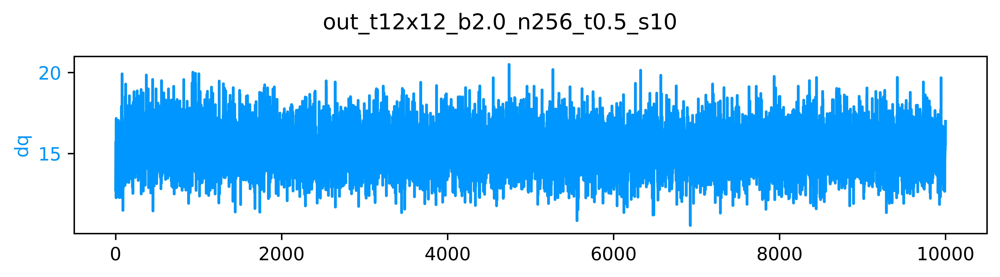

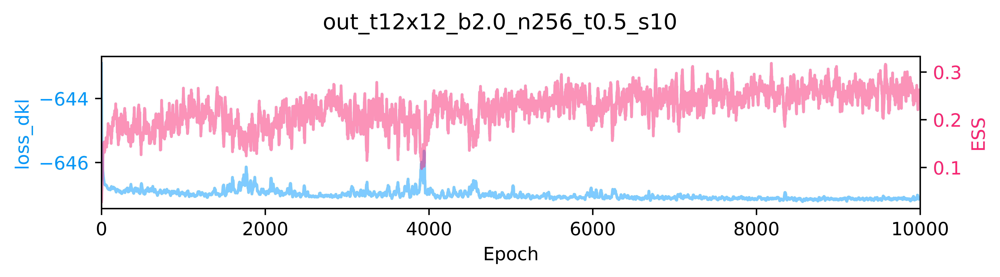

In [20]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

[17:39:33]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933

[17:39:33]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-1710

[17:39:33]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/step.pdf

[17:39:34]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/dt.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/loss.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/dq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/plaq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/loss_dkl.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/logp.pdf

[17:39:35]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-173933/logq.pdf

[17:39:35]  Saving train_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2
            .0_n256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-1710/train_metrics.z.

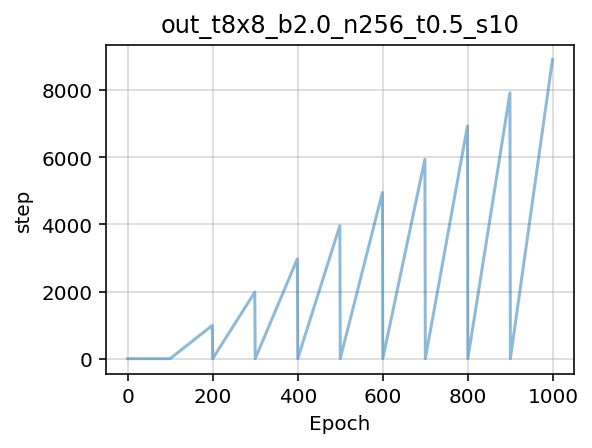

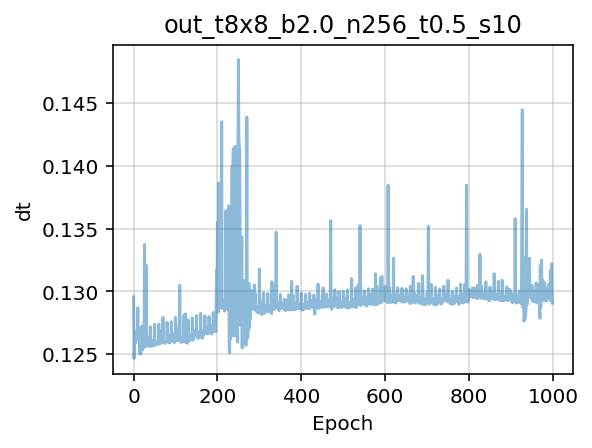

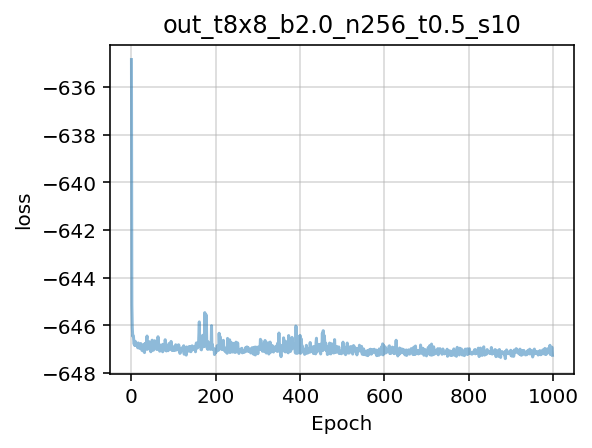

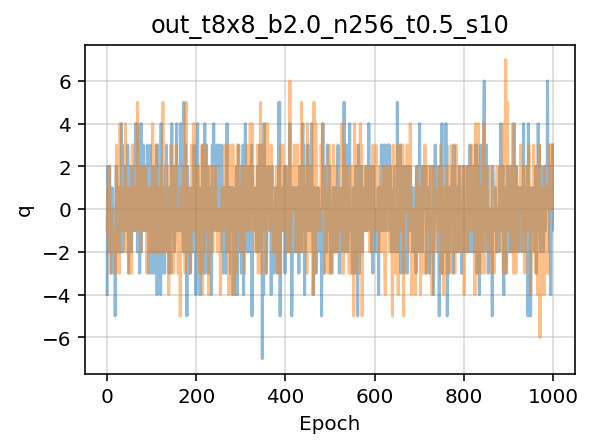

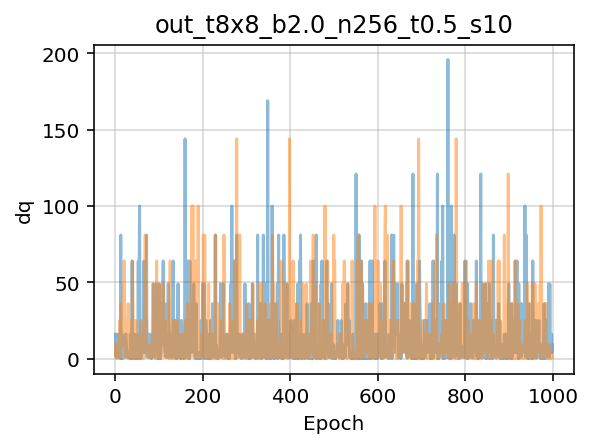

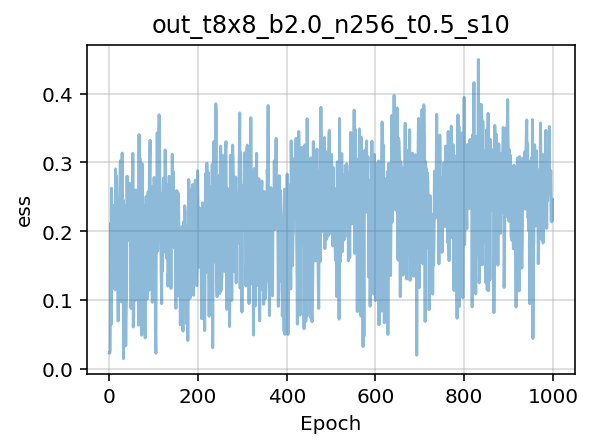

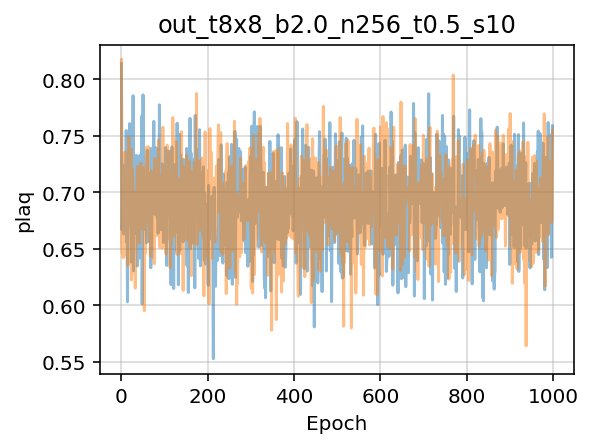

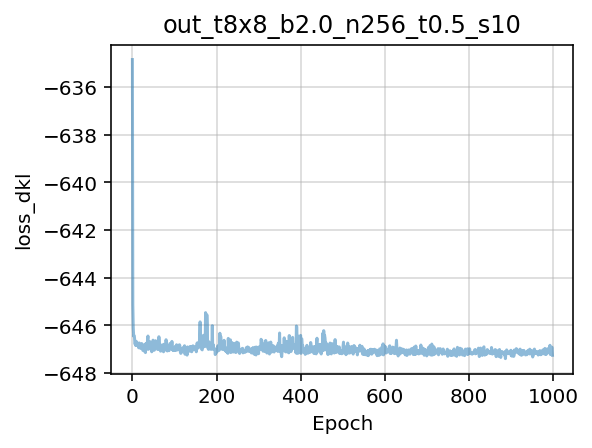

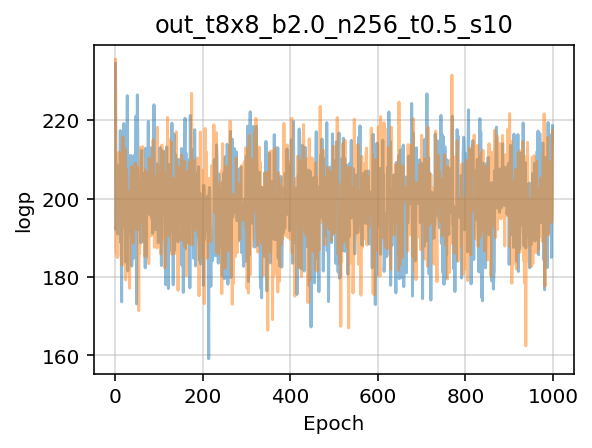

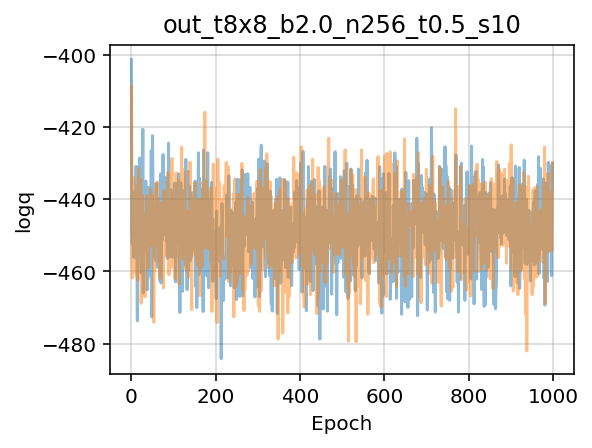

In [21]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

[17:41:39]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933

[17:41:39]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n
            256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-1710

[17:41:39]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/dqsq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/dkl.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/logq.pdf

[17:41:40]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/logp.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x12_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-173933/accepted.pdf

[17:41:40]  Saving inference_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t12x1
            2_b2.0_n256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-1710/inference_m
            etrics.z.

[17:41:40]  Accept rate: 0.4657

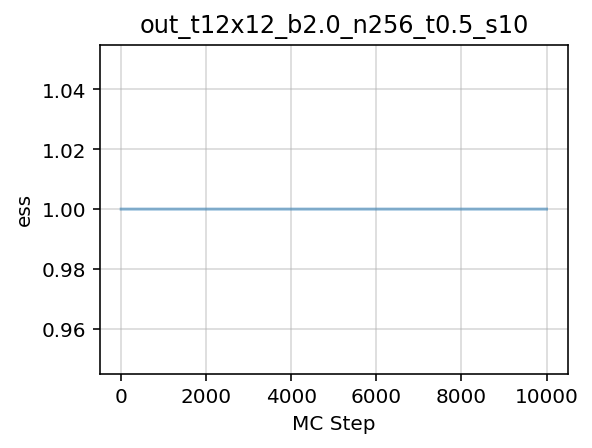

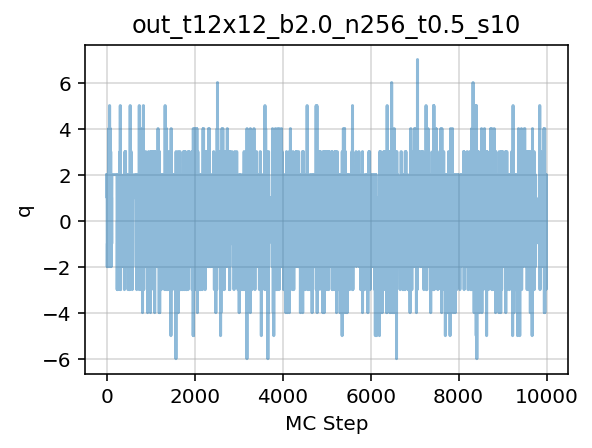

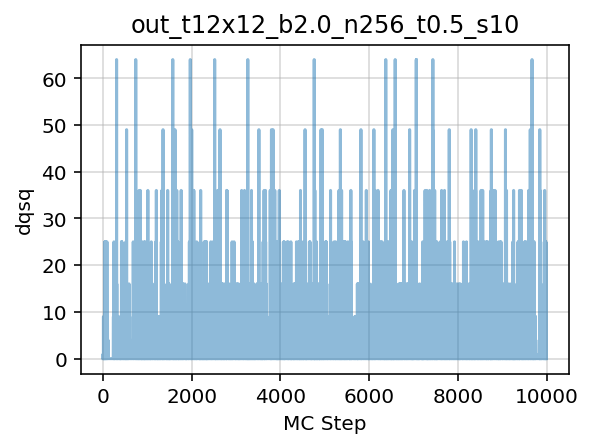

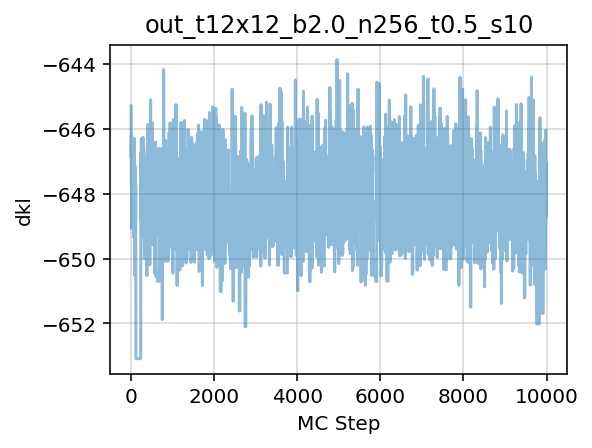

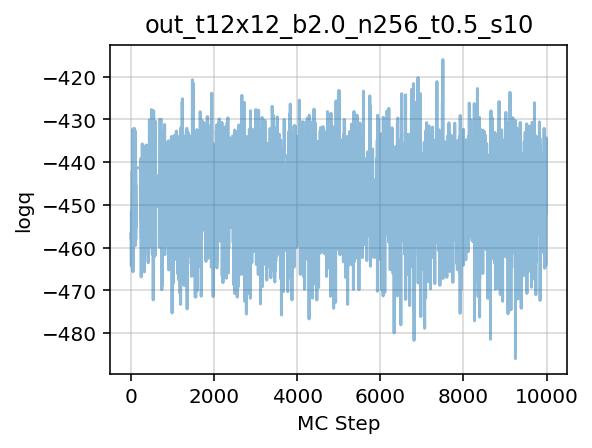

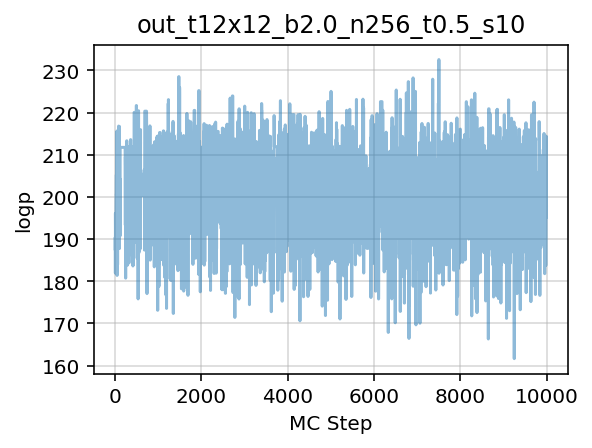

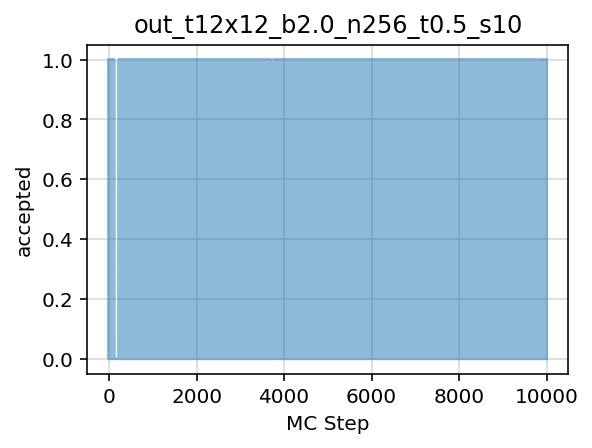

In [22]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

[17:51:31]  Param:                                                                           
            ----------------                                                                 
            beta=2.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=50                                                                        
            seed=1331                                                                        
            randinit=True                                                                    
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.05

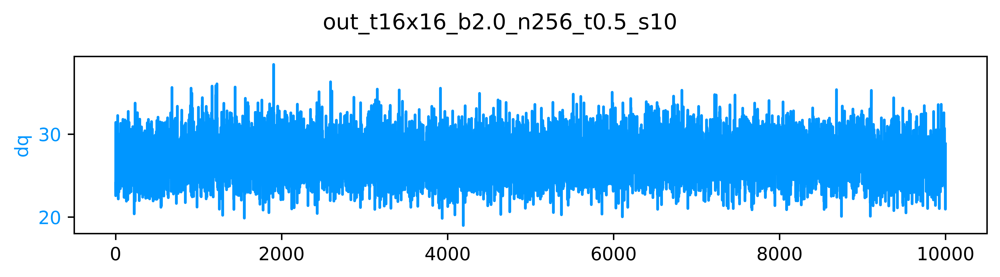

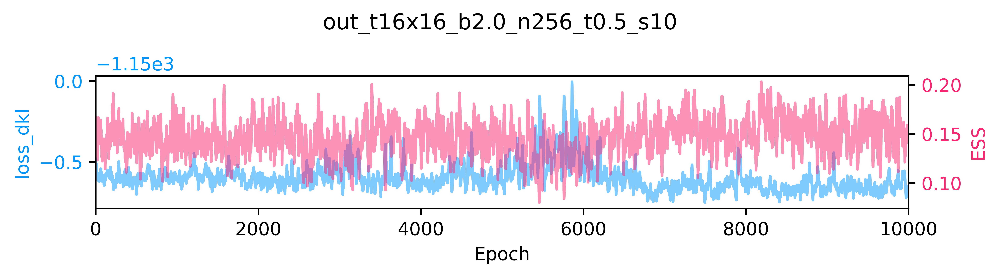

[17:51:32]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:51:45]  epoch=97.000 step=0.000 dt=0.127 loss=-1150.55 dq=27.4633 ess=0.180048           
            plaq=0.689774 loss_dkl=-1150.55 logp=353.164 logq=-797.387

[17:52:00]  epoch=197.000 step=0.000 dt=0.127 loss=-1150.65 dq=27.4391 ess=0.158934          
            plaq=0.690105 loss_dkl=-1150.65 logp=353.334 logq=-797.317

[17:52:14]  epoch=297.000 step=0.000 dt=0.128 loss=-1150.49 dq=26.1477 ess=0.173976          
            plaq=0.69007 loss_dkl=-1150.49 logp=353.316 logq=-797.173

[17:52:29]  epoch=397.000 step=0.000 dt=0.128 loss=-1150.67 dq=29.6961 ess=0.125512          
            plaq=0.692857 loss_dkl=-1150.67 logp=354.743 logq=-795.925

[17:52:44]  epoch=497.000 step=0.000 dt=0.129 loss=-1150.66 dq=26.9992 ess=0.15688           
            plaq=0.688015 loss_dkl=-1150.66 logp=352.264 logq=-798.398

[17:52:59]  epoch=597.000 step=0.000 dt=0.127 loss=-1150.59 dq=26.6617 ess=0.154189          
            plaq=0.692828 loss_dkl=-1150.59 logp=354.728 logq=-795.858

[17:53:14]  epoch=697.000 step=0.000 dt=0.130 loss=-1150.57 dq=27.1492 ess=0.127505          
            plaq=0.690029 loss_dkl=-1150.57 logp=353.295 logq=-797.272

[17:53:28]  epoch=797.000 step=0.000 dt=0.129 loss=-1150.59 dq=28.8922 ess=0.159865          
            plaq=0.690585 loss_dkl=-1150.59 logp=353.58 logq=-797.008

[17:53:43]  epoch=897.000 step=0.000 dt=0.129 loss=-1150.58 dq=27.7117 ess=0.113621          
            plaq=0.690528 loss_dkl=-1150.58 logp=353.551 logq=-797.031

[17:53:58]  epoch=997.000 step=0.000 dt=0.129 loss=-1150.63 dq=28.4008 ess=0.186268          
            plaq=0.689789 loss_dkl=-1150.63 logp=353.172 logq=-797.457

[17:54:00]  ---------------------------------------                                          
            ERA=1, last took: 2 min 27.28 s                                                  
            ---------------------------------------

[17:54:13]  epoch=97.000 step=97.000 dt=0.130 loss=-1150.6 dq=25.8445 ess=0.0881768          
            plaq=0.689541 loss_dkl=-1150.6 logp=353.045 logq=-797.554

[17:54:27]  epoch=197.000 step=197.000 dt=0.129 loss=-1150.61 dq=27.575 ess=0.187832         
            plaq=0.69056 loss_dkl=-1150.61 logp=353.566 logq=-797.042

[17:54:42]  epoch=297.000 step=297.000 dt=0.132 loss=-1150.64 dq=26.9414 ess=0.107503        
            plaq=0.691495 loss_dkl=-1150.64 logp=354.045 logq=-796.598

[17:54:57]  epoch=397.000 step=397.000 dt=0.127 loss=-1150.51 dq=28.5641 ess=0.139306        
            plaq=0.690629 loss_dkl=-1150.51 logp=353.602 logq=-796.906

[17:55:12]  epoch=497.000 step=497.000 dt=0.129 loss=-1150.66 dq=26.4383 ess=0.154123        
            plaq=0.693243 loss_dkl=-1150.66 logp=354.94 logq=-795.722

[17:55:27]  epoch=597.000 step=597.000 dt=0.129 loss=-1150.61 dq=27.1086 ess=0.152907        
            plaq=0.690363 loss_dkl=-1150.61 logp=353.466 logq=-797.141

[17:55:43]  epoch=697.000 step=697.000 dt=0.132 loss=-1150.58 dq=28.2008 ess=0.094952        
            plaq=0.689853 loss_dkl=-1150.58 logp=353.205 logq=-797.38

[17:55:58]  epoch=797.000 step=797.000 dt=0.132 loss=-1150.61 dq=27.393 ess=0.150261         
            plaq=0.689773 loss_dkl=-1150.61 logp=353.164 logq=-797.442

[17:56:14]  epoch=897.000 step=897.000 dt=0.129 loss=-1150.58 dq=25.825 ess=0.126556         
            plaq=0.690798 loss_dkl=-1150.58 logp=353.689 logq=-796.891

[17:56:29]  epoch=997.000 step=997.000 dt=0.131 loss=-1150.56 dq=28.1508 ess=0.117545        
            plaq=0.691568 loss_dkl=-1150.56 logp=354.083 logq=-796.478

[17:56:30]  ---------------------------------------                                          
            ERA=2, last took: 2 min 30.83 s                                                  
            ---------------------------------------

[17:56:44]  epoch=97.000 step=194.000 dt=0.131 loss=-1150.64 dq=27.7555 ess=0.159688         
            plaq=0.689945 loss_dkl=-1150.64 logp=353.252 logq=-797.385

[17:56:59]  epoch=197.000 step=394.000 dt=0.129 loss=-1150.6 dq=26.9992 ess=0.130891         
            plaq=0.68924 loss_dkl=-1150.6 logp=352.891 logq=-797.71

[17:57:13]  epoch=297.000 step=594.000 dt=0.135 loss=-1150.59 dq=28.0227 ess=0.134483        
            plaq=0.689891 loss_dkl=-1150.59 logp=353.224 logq=-797.368

[17:57:29]  epoch=397.000 step=794.000 dt=0.128 loss=-1150.61 dq=26.5281 ess=0.122541        
            plaq=0.690422 loss_dkl=-1150.61 logp=353.496 logq=-797.117

[17:57:44]  epoch=497.000 step=994.000 dt=0.130 loss=-1150.51 dq=27.1078 ess=0.171338        
            plaq=0.692561 loss_dkl=-1150.51 logp=354.591 logq=-795.92

[17:57:59]  epoch=597.000 step=1194.000 dt=0.129 loss=-1150.49 dq=29.4273 ess=0.120723       
            plaq=0.689692 loss_dkl=-1150.49 logp=353.122 logq=-797.367

[17:58:14]  epoch=697.000 step=1394.000 dt=0.129 loss=-1150.54 dq=28.2203 ess=0.160441       
            plaq=0.688878 loss_dkl=-1150.54 logp=352.706 logq=-797.831

[17:58:29]  epoch=797.000 step=1594.000 dt=0.130 loss=-1150.64 dq=28.7492 ess=0.167432       
            plaq=0.689736 loss_dkl=-1150.64 logp=353.145 logq=-797.49

[17:58:44]  epoch=897.000 step=1794.000 dt=0.130 loss=-1150.64 dq=26.7875 ess=0.119258       
            plaq=0.689167 loss_dkl=-1150.64 logp=352.854 logq=-797.789

[17:58:59]  epoch=997.000 step=1994.000 dt=0.129 loss=-1150.58 dq=26.4477 ess=0.136848       
            plaq=0.690209 loss_dkl=-1150.58 logp=353.387 logq=-797.194

[17:59:01]  ---------------------------------------                                          
            ERA=3, last took: 2 min 30.79 s                                                  
            ---------------------------------------

[17:59:14]  epoch=97.000 step=291.000 dt=0.131 loss=-1150.57 dq=28.8687 ess=0.139544         
            plaq=0.692169 loss_dkl=-1150.57 logp=354.391 logq=-796.177

[17:59:29]  epoch=197.000 step=591.000 dt=0.129 loss=-1150.52 dq=27.0148 ess=0.118874        
            plaq=0.691244 loss_dkl=-1150.52 logp=353.917 logq=-796.599

[17:59:44]  epoch=297.000 step=891.000 dt=0.130 loss=-1150.68 dq=27.8305 ess=0.162685        
            plaq=0.68954 loss_dkl=-1150.68 logp=353.044 logq=-797.638

[17:59:59]  epoch=397.000 step=1191.000 dt=0.130 loss=-1150.72 dq=26.8 ess=0.18103           
            plaq=0.691253 loss_dkl=-1150.72 logp=353.921 logq=-796.796

[18:00:14]  epoch=497.000 step=1491.000 dt=0.130 loss=-1150.61 dq=29.4328 ess=0.2015         
            plaq=0.688958 loss_dkl=-1150.61 logp=352.746 logq=-797.862

[18:00:29]  epoch=597.000 step=1791.000 dt=0.129 loss=-1150.65 dq=26.9891 ess=0.127397       
            plaq=0.689993 loss_dkl=-1150.65 logp=353.276 logq=-797.374

[18:00:44]  epoch=697.000 step=2091.000 dt=0.130 loss=-1150.58 dq=24.168 ess=0.164358        
            plaq=0.688508 loss_dkl=-1150.58 logp=352.516 logq=-798.064

[18:01:00]  epoch=797.000 step=2391.000 dt=0.129 loss=-1150.26 dq=27.1609 ess=0.0731977      
            plaq=0.692515 loss_dkl=-1150.26 logp=354.568 logq=-795.693

[18:01:15]  epoch=897.000 step=2691.000 dt=0.129 loss=-1150.44 dq=27.632 ess=0.0895663       
            plaq=0.690781 loss_dkl=-1150.44 logp=353.68 logq=-796.765

[18:01:30]  epoch=997.000 step=2991.000 dt=0.130 loss=-1150.67 dq=28.0711 ess=0.143671       
            plaq=0.689383 loss_dkl=-1150.67 logp=352.964 logq=-797.708

[18:01:32]  ---------------------------------------                                          
            ERA=4, last took: 2 min 30.29 s                                                  
            ---------------------------------------

[18:01:45]  epoch=97.000 step=388.000 dt=0.130 loss=-1150.68 dq=28.2719 ess=0.100344         
            plaq=0.693057 loss_dkl=-1150.68 logp=354.845 logq=-795.836

[18:02:00]  epoch=197.000 step=788.000 dt=0.129 loss=-1150.59 dq=26.6141 ess=0.149268        
            plaq=0.689752 loss_dkl=-1150.59 logp=353.153 logq=-797.436

[18:02:15]  epoch=297.000 step=1188.000 dt=0.129 loss=-1150.63 dq=26.2727 ess=0.148041       
            plaq=0.690471 loss_dkl=-1150.63 logp=353.521 logq=-797.11

[18:02:30]  epoch=397.000 step=1588.000 dt=0.130 loss=-1150.67 dq=25.3805 ess=0.101966       
            plaq=0.690815 loss_dkl=-1150.67 logp=353.697 logq=-796.977

[18:02:45]  epoch=497.000 step=1988.000 dt=0.129 loss=-1150.68 dq=26.1422 ess=0.140645       
            plaq=0.6912 loss_dkl=-1150.68 logp=353.895 logq=-796.781

[18:03:00]  epoch=597.000 step=2388.000 dt=0.130 loss=-1150.58 dq=26.4164 ess=0.165651       
            plaq=0.691306 loss_dkl=-1150.58 logp=353.949 logq=-796.627

[18:03:15]  epoch=697.000 step=2788.000 dt=0.131 loss=-1150.58 dq=26.05 ess=0.116822         
            plaq=0.690539 loss_dkl=-1150.58 logp=353.556 logq=-797.02

[18:03:30]  epoch=797.000 step=3188.000 dt=0.129 loss=-1150.7 dq=26.2086 ess=0.196969        
            plaq=0.690039 loss_dkl=-1150.7 logp=353.3 logq=-797.396

[18:03:45]  epoch=897.000 step=3588.000 dt=0.130 loss=-1150.68 dq=26.4266 ess=0.159391       
            plaq=0.690762 loss_dkl=-1150.68 logp=353.67 logq=-797.012

[18:04:00]  epoch=997.000 step=3988.000 dt=0.130 loss=-1150.65 dq=27.6586 ess=0.133013       
            plaq=0.690844 loss_dkl=-1150.65 logp=353.712 logq=-796.936

[18:04:02]  ---------------------------------------                                          
            ERA=5, last took: 2 min 30.95 s                                                  
            ---------------------------------------

[18:04:16]  epoch=97.000 step=485.000 dt=0.130 loss=-1150.36 dq=26.5422 ess=0.139412         
            plaq=0.687821 loss_dkl=-1150.36 logp=352.164 logq=-798.2

[18:04:31]  epoch=197.000 step=985.000 dt=0.130 loss=-1150.53 dq=26.7445 ess=0.126965        
            plaq=0.689949 loss_dkl=-1150.53 logp=353.254 logq=-797.276

[18:04:46]  epoch=297.000 step=1485.000 dt=0.130 loss=-1150.65 dq=27.4758 ess=0.120131       
            plaq=0.689891 loss_dkl=-1150.65 logp=353.224 logq=-797.423

[18:05:01]  epoch=397.000 step=1985.000 dt=0.131 loss=-1150.46 dq=27.2297 ess=0.110033       
            plaq=0.689335 loss_dkl=-1150.46 logp=352.94 logq=-797.524

[18:05:16]  epoch=497.000 step=2485.000 dt=0.130 loss=-1150.19 dq=29.4383 ess=0.142582       
            plaq=0.689699 loss_dkl=-1150.19 logp=353.126 logq=-797.063

[18:05:31]  epoch=597.000 step=2985.000 dt=0.130 loss=-1150.26 dq=28.0148 ess=0.113107       
            plaq=0.690968 loss_dkl=-1150.26 logp=353.776 logq=-796.482

[18:05:47]  epoch=697.000 step=3485.000 dt=0.130 loss=-1150.28 dq=26.8367 ess=0.0921333      
            plaq=0.690056 loss_dkl=-1150.28 logp=353.309 logq=-796.971

[18:06:02]  epoch=797.000 step=3985.000 dt=0.130 loss=-1150.41 dq=26.55 ess=0.158401         
            plaq=0.689174 loss_dkl=-1150.41 logp=352.857 logq=-797.552

[18:06:17]  epoch=897.000 step=4485.000 dt=0.129 loss=-1150.5 dq=25.3 ess=0.151926           
            plaq=0.688877 loss_dkl=-1150.5 logp=352.705 logq=-797.797

[18:06:32]  epoch=997.000 step=4985.000 dt=0.130 loss=-1150.52 dq=27.243 ess=0.142794        
            plaq=0.691917 loss_dkl=-1150.52 logp=354.262 logq=-796.256

[18:06:34]  ---------------------------------------                                          
            ERA=6, last took: 2 min 31.7 s                                                   
            ---------------------------------------

[18:06:47]  epoch=97.000 step=582.000 dt=0.130 loss=-1150.5 dq=27.4438 ess=0.12561           
            plaq=0.691254 loss_dkl=-1150.5 logp=353.922 logq=-796.581

[18:07:03]  epoch=197.000 step=1182.000 dt=0.130 loss=-1150.62 dq=27.207 ess=0.149279        
            plaq=0.690831 loss_dkl=-1150.62 logp=353.705 logq=-796.911

[18:07:18]  epoch=297.000 step=1782.000 dt=0.130 loss=-1150.45 dq=27.2914 ess=0.154325       
            plaq=0.692518 loss_dkl=-1150.45 logp=354.569 logq=-795.883

[18:07:33]  epoch=397.000 step=2382.000 dt=0.130 loss=-1150.53 dq=28.0383 ess=0.171149       
            plaq=0.690304 loss_dkl=-1150.53 logp=353.436 logq=-797.094

[18:07:48]  epoch=497.000 step=2982.000 dt=0.130 loss=-1150.5 dq=29.1758 ess=0.116516        
            plaq=0.692651 loss_dkl=-1150.5 logp=354.638 logq=-795.861

[18:08:03]  epoch=597.000 step=3582.000 dt=0.130 loss=-1150.43 dq=28.1305 ess=0.125968       
            plaq=0.687734 loss_dkl=-1150.43 logp=352.12 logq=-798.314

[18:08:19]  epoch=697.000 step=4182.000 dt=0.130 loss=-1150.56 dq=27.2445 ess=0.167824       
            plaq=0.688849 loss_dkl=-1150.56 logp=352.691 logq=-797.866

[18:08:34]  epoch=797.000 step=4782.000 dt=0.130 loss=-1150.76 dq=27.3219 ess=0.152316       
            plaq=0.690315 loss_dkl=-1150.76 logp=353.441 logq=-797.318

[18:08:49]  epoch=897.000 step=5382.000 dt=0.129 loss=-1150.66 dq=25.8328 ess=0.16053        
            plaq=0.693722 loss_dkl=-1150.66 logp=355.186 logq=-795.479

[18:09:05]  epoch=997.000 step=5982.000 dt=0.129 loss=-1150.6 dq=27.8547 ess=0.127388        
            plaq=0.690173 loss_dkl=-1150.6 logp=353.369 logq=-797.227

[18:09:07]  ---------------------------------------                                          
            ERA=7, last took: 2 min 32.47 s                                                  
            ---------------------------------------

[18:09:20]  epoch=97.000 step=679.000 dt=0.130 loss=-1150.61 dq=25.268 ess=0.179852          
            plaq=0.692159 loss_dkl=-1150.61 logp=354.385 logq=-796.229

[18:09:35]  epoch=197.000 step=1379.000 dt=0.129 loss=-1150.59 dq=26.7367 ess=0.163103       
            plaq=0.689566 loss_dkl=-1150.59 logp=353.058 logq=-797.535

[18:09:50]  epoch=297.000 step=2079.000 dt=0.129 loss=-1150.66 dq=28.3641 ess=0.165993       
            plaq=0.691796 loss_dkl=-1150.66 logp=354.2 logq=-796.462

[18:10:06]  epoch=397.000 step=2779.000 dt=0.130 loss=-1150.7 dq=28.1336 ess=0.20115         
            plaq=0.691433 loss_dkl=-1150.7 logp=354.014 logq=-796.683

[18:10:21]  epoch=497.000 step=3479.000 dt=0.129 loss=-1150.74 dq=26.4438 ess=0.174446       
            plaq=0.689864 loss_dkl=-1150.74 logp=353.21 logq=-797.532

[18:10:36]  epoch=597.000 step=4179.000 dt=0.130 loss=-1150.67 dq=28.3852 ess=0.143981       
            plaq=0.692677 loss_dkl=-1150.67 logp=354.651 logq=-796.017

[18:10:52]  epoch=697.000 step=4879.000 dt=0.129 loss=-1150.7 dq=25.5055 ess=0.109481        
            plaq=0.692059 loss_dkl=-1150.7 logp=354.334 logq=-796.369

[18:11:07]  epoch=797.000 step=5579.000 dt=0.129 loss=-1150.62 dq=26.7406 ess=0.13947        
            plaq=0.691646 loss_dkl=-1150.62 logp=354.123 logq=-796.493

[18:11:22]  epoch=897.000 step=6279.000 dt=0.129 loss=-1150.7 dq=27.6789 ess=0.17124         
            plaq=0.691445 loss_dkl=-1150.7 logp=354.02 logq=-796.677

[18:11:38]  epoch=997.000 step=6979.000 dt=0.130 loss=-1150.71 dq=26.8203 ess=0.178969       
            plaq=0.691917 loss_dkl=-1150.71 logp=354.261 logq=-796.449

[18:11:40]  ---------------------------------------                                          
            ERA=8, last took: 2 min 33.15 s                                                  
            ---------------------------------------

[18:11:53]  epoch=97.000 step=776.000 dt=0.130 loss=-1150.63 dq=26.4367 ess=0.162119         
            plaq=0.691779 loss_dkl=-1150.63 logp=354.191 logq=-796.435

[18:12:08]  epoch=197.000 step=1576.000 dt=0.129 loss=-1150.65 dq=26.1375 ess=0.172683       
            plaq=0.693619 loss_dkl=-1150.65 logp=355.133 logq=-795.512

[18:12:24]  epoch=297.000 step=2376.000 dt=0.131 loss=-1150.63 dq=27.1781 ess=0.150392       
            plaq=0.692582 loss_dkl=-1150.63 logp=354.602 logq=-796.025

[18:12:39]  epoch=397.000 step=3176.000 dt=0.130 loss=-1150.69 dq=27.1508 ess=0.168385       
            plaq=0.693276 loss_dkl=-1150.69 logp=354.957 logq=-795.728

[18:12:54]  epoch=497.000 step=3976.000 dt=0.129 loss=-1150.65 dq=26.5344 ess=0.130439       
            plaq=0.691002 loss_dkl=-1150.65 logp=353.793 logq=-796.854

[18:13:10]  epoch=597.000 step=4776.000 dt=0.130 loss=-1150.61 dq=26.0242 ess=0.119341       
            plaq=0.69196 loss_dkl=-1150.61 logp=354.284 logq=-796.323

[18:13:25]  epoch=697.000 step=5576.000 dt=0.130 loss=-1150.74 dq=27.4453 ess=0.11583        
            plaq=0.690091 loss_dkl=-1150.74 logp=353.327 logq=-797.416

[18:13:40]  epoch=797.000 step=6376.000 dt=0.130 loss=-1150.72 dq=26.9641 ess=0.20036        
            plaq=0.690162 loss_dkl=-1150.72 logp=353.363 logq=-797.362

[18:13:56]  epoch=897.000 step=7176.000 dt=0.130 loss=-1150.56 dq=27.8781 ess=0.156692       
            plaq=0.691757 loss_dkl=-1150.56 logp=354.18 logq=-796.378

[18:14:11]  epoch=997.000 step=7976.000 dt=0.130 loss=-1150.7 dq=27.9719 ess=0.187774        
            plaq=0.690316 loss_dkl=-1150.7 logp=353.442 logq=-797.263

[18:14:13]  ---------------------------------------                                          
            ERA=9, last took: 2 min 33.61 s                                                  
            ---------------------------------------

[18:14:27]  epoch=97.000 step=873.000 dt=0.130 loss=-1150.63 dq=27.5383 ess=0.187456         
            plaq=0.688953 loss_dkl=-1150.63 logp=352.744 logq=-797.882

[18:14:42]  epoch=197.000 step=1773.000 dt=0.130 loss=-1150.62 dq=27.5711 ess=0.181435       
            plaq=0.691276 loss_dkl=-1150.62 logp=353.933 logq=-796.688

[18:14:57]  epoch=297.000 step=2673.000 dt=0.130 loss=-1150.64 dq=27.8781 ess=0.1196         
            plaq=0.691161 loss_dkl=-1150.64 logp=353.875 logq=-796.766

[18:15:13]  epoch=397.000 step=3573.000 dt=0.130 loss=-1150.61 dq=28.4508 ess=0.153742       
            plaq=0.689373 loss_dkl=-1150.61 logp=352.959 logq=-797.655

[18:15:28]  epoch=497.000 step=4473.000 dt=0.130 loss=-1150.64 dq=26.9703 ess=0.163339       
            plaq=0.690034 loss_dkl=-1150.64 logp=353.297 logq=-797.345

[18:15:44]  epoch=597.000 step=5373.000 dt=0.130 loss=-1150.66 dq=26.0883 ess=0.150572       
            plaq=0.690177 loss_dkl=-1150.66 logp=353.371 logq=-797.288

[18:15:59]  epoch=697.000 step=6273.000 dt=0.130 loss=-1150.62 dq=25.5836 ess=0.141417       
            plaq=0.691663 loss_dkl=-1150.62 logp=354.132 logq=-796.486

[18:16:15]  epoch=797.000 step=7173.000 dt=0.130 loss=-1150.75 dq=26.7734 ess=0.13097        
            plaq=0.692001 loss_dkl=-1150.75 logp=354.304 logq=-796.444

[18:16:30]  epoch=897.000 step=8073.000 dt=0.130 loss=-1150.59 dq=26.4594 ess=0.150571       
            plaq=0.688478 loss_dkl=-1150.59 logp=352.501 logq=-798.093

[18:16:46]  epoch=997.000 step=8973.000 dt=0.130 loss=-1150.61 dq=25.132 ess=0.177386        
            plaq=0.690583 loss_dkl=-1150.61 logp=353.578 logq=-797.031

[18:16:48]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/models/pre_flow_model/2021-05-25-1751

[18:16:48]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0
            _n256_t0.5_s10/models/pre_flow_model/2021-05-25-1751/pre_flow_model.tar

[18:16:49]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1751

[18:16:49]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1751/dq_training.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-1751/loss_dkl_ess_training.pd
            f

[18:16:50]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650

[18:16:50]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-1751

[18:16:50]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/step.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/dt.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/loss.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/q.pdf

[18:16:51]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/dq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/plaq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/loss_dkl.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/logp.pdf

[18:16:52]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/training/pre_flow_model/2021-05-25-181650/logq.pdf

[18:16:52]  Saving train_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2
            .0_n256_t0.5_s10/metrics/training/pre_flow_model/2021-05-25-1751/train_metrics.z.

[18:17:04]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650

[18:17:04]  Creating directory: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n
            256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-1751

[18:17:04]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/ess.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/q.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/dqsq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/dkl.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/logq.pdf

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/logp.pdf

[18:17:05]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x16_b2.0_n25
            6_t0.5_s10/plots/inference/pre_flow_model/2021-05-25-181650/accepted.pdf

[18:17:05]  Saving inference_metrics to /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/out_t16x1
            6_b2.0_n256_t0.5_s10/metrics/inference/pre_flow_model/2021-05-25-1751/inference_m
            etrics.z.

[18:17:05]  Accept rate: 0.4657

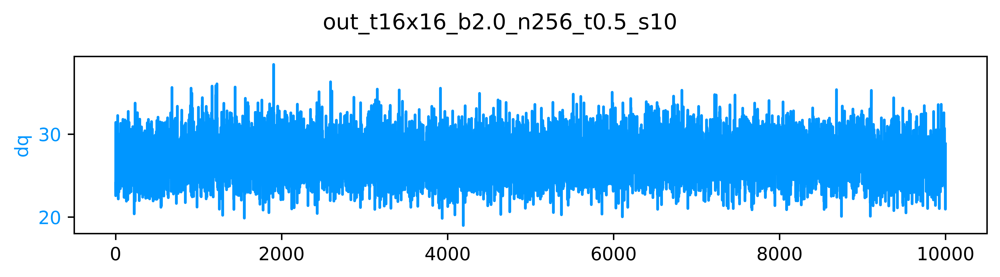

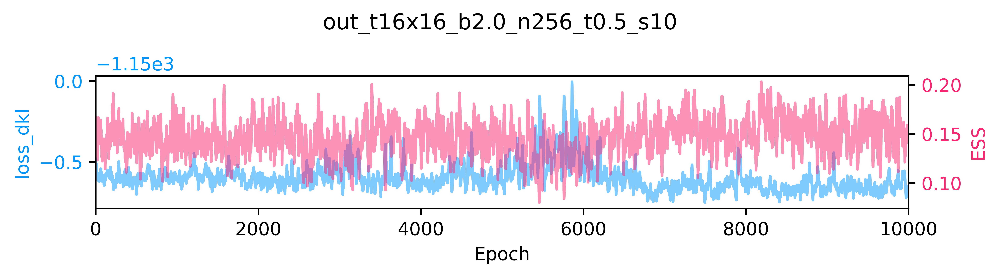

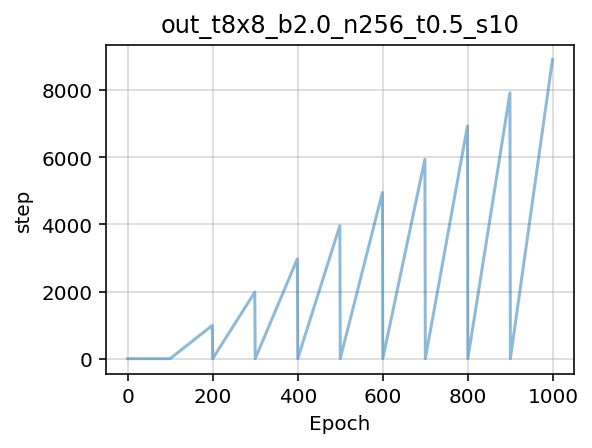

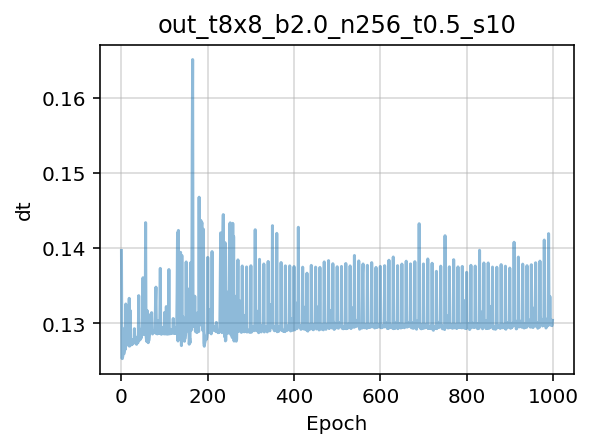

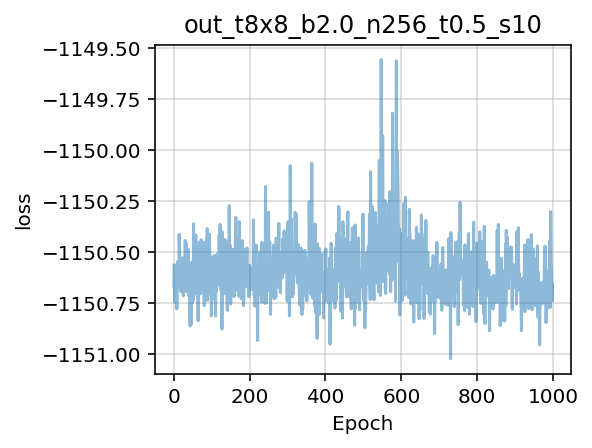

...

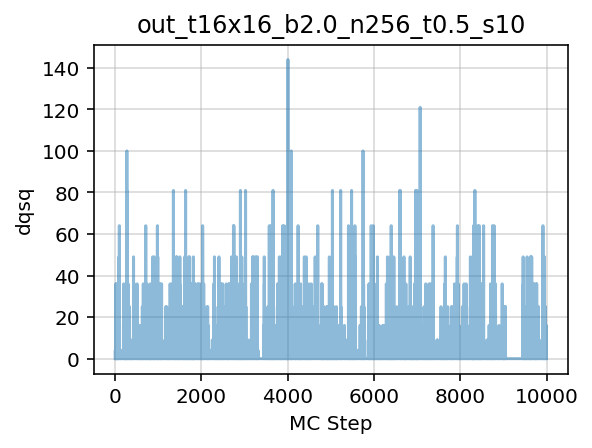

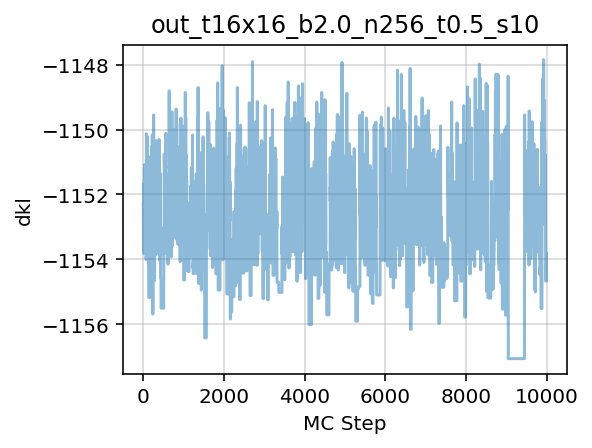

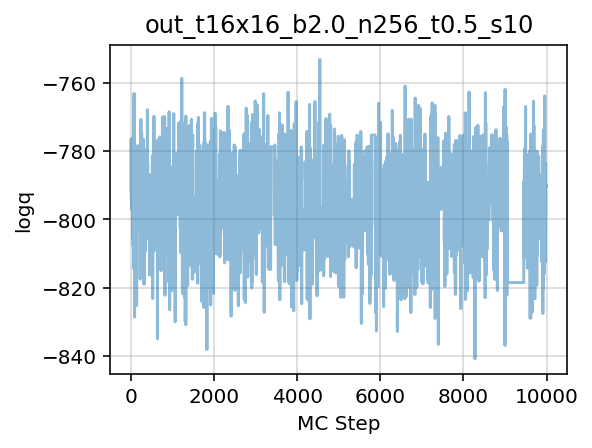

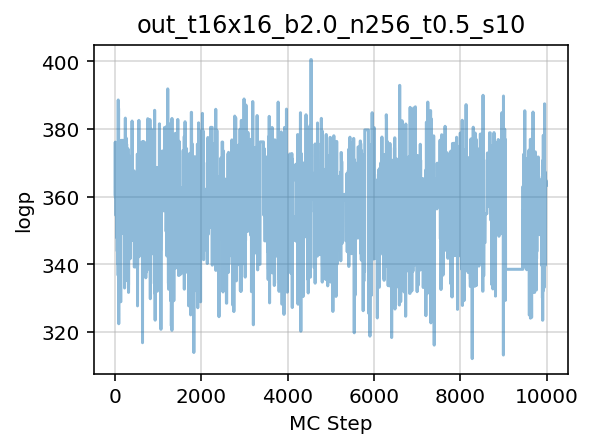

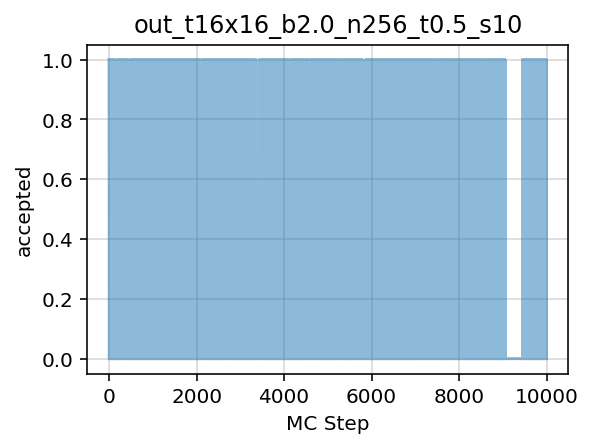

In [24]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [26]:
pre_flow_model.keys()

dict_keys(['layers', 'prior'])

In [32]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

[19:20:48]  [                                                                                
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                    

In [33]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

[19:21:08]  [                                                                                
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                                                             
                torch.Size([8, 2, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([8, 8, 3, 3]),                                                    
                torch.Size([8]),                                                             
                torch.Size([3, 8, 3, 3]),                                                    
                torch.Size([3]),                    

In [30]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

[19:19:28]  OrderedDict([('0.plaq_coupling.net.0.weight', tensor([[[[ 0.3115,  0.2976,       
            -0.3184],                                                                        
                      [ 0.2571,  0.2997, -0.2724],                                           
                      [ 0.2039, -0.0552, -0.2248]],                                          
                                                                                             
                     [[-0.2647, -0.0313,  0.2783],                                           
                      [-0.2265, -0.2065, -0.0738],                                           
                      [ 0.2829,  0.3290,  0.5797]]],                                         
                                                                                             
                                                                                             
                    [[[ 0.1538, -0.0855, -0.1435],                                           
                      [-0.1691, -0.4977, -0.3376],                                           
                      [-0.1113, -0.1078,  0.1315]],                                          
                                                                                             
                     [[-0.1080,  0.1571,  0.2434],                                           
                      [ 0.1040,  0.3357,  0.5584],                                           
                      [-0.0135,  0.3063,  0.0758]]],                                         
                                                                                             
                                                                                             
                    [[[-0.2868, -0.2115, -0.1211],                                           
                      [-0.2229, -0.5196,  0.1397],                                           
                      [-0.2182, -0.1292,  0.0472]],                                          
                                                                                             
                     [[-0.0641, -0.2217, -0.1389],                                           
                      [-0.0851,  0.0078, -0.0569],                                           
                      [-0.0028,  0.2378,  0.3244]]],                                         
                                                                                             
                                                                                             
                    [[[ 0.0541, -0.0342,  0.0434],                                           
                      [ 0.0996, -0.0079,  0.0296],                                           
                      [ 0.0439, -0.4672, -0.3042]],                                          
                                                                                             
                     [[-0.1527,  0.0877,  0.0964],                                           
                      [ 0.2126,  0.3492, -0.0154],                                           
                      [-0.3337, -0.6598, -0.0763]]],                                         
                                                                                             
                                                                                             
                    [[[-0.1546, -0.1657, -0.2064],                                           
                      [-0.1393, -0.3952, -0.0099],                                           
                      [-0.0927, -0.0016,  0.2950]],                                          
                                                                                             
                     [[-0.0284,  0.2610,  0.4557],                                           
                      [-0.1447, -0.0331,  0.2212],  

TORCH DEVICE: cuda


TrainConfig(n_era=100, n_epoch=100, n_layers=32, n_s_nets=2, hidden_sizes=[8, 8], kernel_size=3, base_lr=0.001, batch_size=1024, print_freq=10, plot_freq=50, with_force=True)

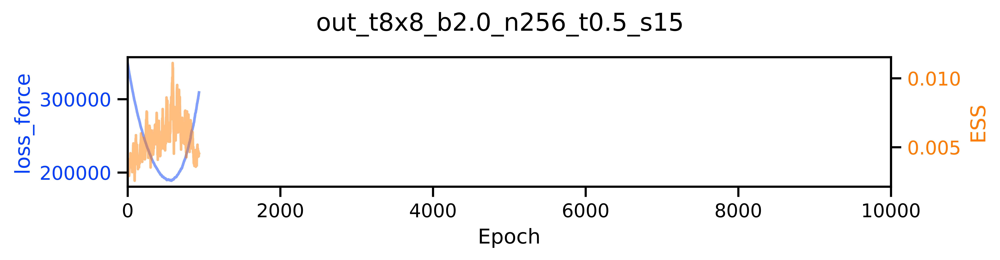

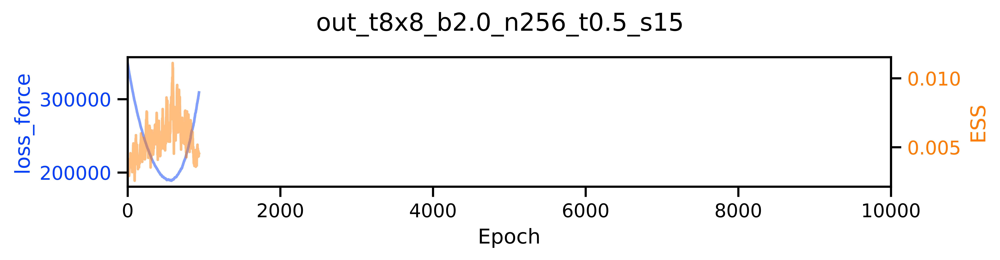

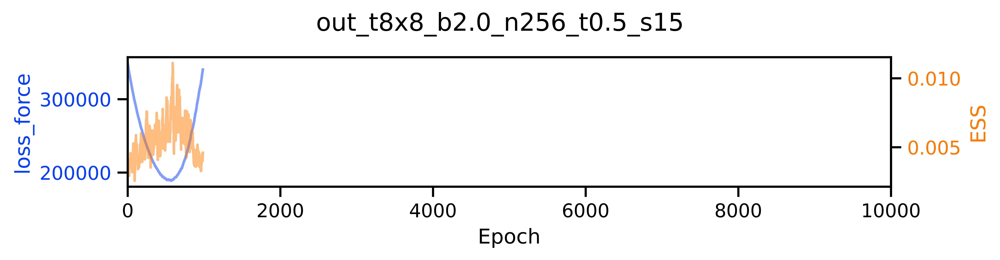

[13:59:55]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=0, last took: 0 min 0 s                                                                                                                                                                                                                         
            -------------------------------------------------------------------

[14:00:05]  epoch=7.000 dt=0.921 loss=349382.062 dq=0.170 ess=0.004 loss_dkl=0.000 logp=87.879 logq=-233.835 loss_force=349382.081 force_size=349382.062 force_norm=591.084

[14:00:15]  epoch=17.000 dt=0.918 loss=342618.562 dq=0.185 ess=0.004 loss_dkl=0.000 logp=87.827 logq=-233.471 loss_force=342618.556 force_size=342618.562 force_norm=585.334

[14:00:24]  epoch=27.000 dt=0.909 loss=335547.594 dq=0.173 ess=0.002 loss_dkl=0.000 logp=87.864 logq=-233.089 loss_force=335547.588 force_size=335547.594 force_norm=579.263

[14:00:33]  epoch=37.000 dt=0.918 loss=330418.812 dq=0.179 ess=0.006 loss_dkl=0.000 logp=88.006 logq=-232.717 loss_force=330418.812 force_size=330418.812 force_norm=574.820

[14:00:42]  epoch=47.000 dt=0.921 loss=325021.906 dq=0.184 ess=0.004 loss_dkl=0.000 logp=87.892 logq=-232.352 loss_force=325021.919 force_size=325021.906 force_norm=570.106

[14:00:54]  epoch=57.000 dt=0.919 loss=319582.062 dq=0.175 ess=0.005 loss_dkl=0.000 logp=87.619 logq=-232.025 loss_force=319582.069 force_size=319582.062 force_norm=565.314

[14:01:04]  epoch=67.000 dt=0.917 loss=312900.344 dq=0.192 ess=0.003 loss_dkl=0.000 logp=87.959 logq=-231.668 loss_force=312900.325 force_size=312900.344 force_norm=559.374

[14:01:13]  epoch=77.000 dt=0.917 loss=308271.500 dq=0.182 ess=0.006 loss_dkl=0.000 logp=88.000 logq=-231.302 loss_force=308271.494 force_size=308271.500 force_norm=555.219

[14:01:22]  epoch=87.000 dt=0.923 loss=302801.500 dq=0.181 ess=0.005 loss_dkl=0.000 logp=87.928 logq=-230.966 loss_force=302801.531 force_size=302801.500 force_norm=550.271

[14:01:31]  epoch=97.000 dt=0.921 loss=297788.656 dq=0.187 ess=0.002 loss_dkl=0.000 logp=87.973 logq=-230.636 loss_force=297788.644 force_size=297788.656 force_norm=545.699

[14:01:34]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=1, last took: 1 min 38.66 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:01:43]  epoch=7.000 dt=0.916 loss=293881.906 dq=0.191 ess=0.005 loss_dkl=0.000 logp=87.823 logq=-230.306 loss_force=293881.894 force_size=293881.906 force_norm=542.106

[14:01:53]  epoch=17.000 dt=0.922 loss=289758.938 dq=0.201 ess=0.004 loss_dkl=0.000 logp=87.725 logq=-229.992 loss_force=289758.938 force_size=289758.938 force_norm=538.291

[14:02:02]  epoch=27.000 dt=0.918 loss=283250.906 dq=0.198 ess=0.005 loss_dkl=0.000 logp=87.896 logq=-229.652 loss_force=283250.900 force_size=283250.906 force_norm=532.212

[14:02:11]  epoch=37.000 dt=0.919 loss=279002.062 dq=0.224 ess=0.004 loss_dkl=0.000 logp=87.818 logq=-229.334 loss_force=279002.044 force_size=279002.062 force_norm=528.206

[14:02:20]  epoch=47.000 dt=0.925 loss=275139.406 dq=0.226 ess=0.002 loss_dkl=0.000 logp=87.783 logq=-229.022 loss_force=275139.400 force_size=275139.406 force_norm=524.536

[14:02:32]  epoch=57.000 dt=0.925 loss=271364.625 dq=0.220 ess=0.004 loss_dkl=0.000 logp=87.911 logq=-228.693 loss_force=271364.650 force_size=271364.625 force_norm=520.926

[14:02:42]  epoch=67.000 dt=0.920 loss=267911.750 dq=0.213 ess=0.005 loss_dkl=0.000 logp=87.720 logq=-228.408 loss_force=267911.725 force_size=267911.750 force_norm=517.601

[14:02:51]  epoch=77.000 dt=0.921 loss=263966.656 dq=0.220 ess=0.006 loss_dkl=0.000 logp=87.844 logq=-228.072 loss_force=263966.628 force_size=263966.656 force_norm=513.774

[14:03:00]  epoch=87.000 dt=0.917 loss=260106.125 dq=0.236 ess=0.006 loss_dkl=0.000 logp=87.768 logq=-227.791 loss_force=260106.134 force_size=260106.125 force_norm=510.005

[14:03:09]  epoch=97.000 dt=0.915 loss=256895.906 dq=0.239 ess=0.003 loss_dkl=0.000 logp=87.761 logq=-227.481 loss_force=256895.891 force_size=256895.906 force_norm=506.847

[14:03:12]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=2, last took: 1 min 38.04 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:03:21]  epoch=7.000 dt=0.916 loss=252590.531 dq=0.234 ess=0.007 loss_dkl=0.000 logp=87.854 logq=-227.176 loss_force=252590.519 force_size=252590.531 force_norm=502.583

[14:03:31]  epoch=17.000 dt=0.916 loss=249466.250 dq=0.237 ess=0.004 loss_dkl=0.000 logp=87.855 logq=-226.882 loss_force=249466.247 force_size=249466.250 force_norm=499.463

[14:03:40]  epoch=27.000 dt=0.934 loss=245849.500 dq=0.242 ess=0.005 loss_dkl=0.000 logp=87.880 logq=-226.594 loss_force=245849.497 force_size=245849.500 force_norm=495.832

[14:03:49]  epoch=37.000 dt=0.941 loss=241978.219 dq=0.250 ess=0.004 loss_dkl=0.000 logp=87.771 logq=-226.296 loss_force=241978.222 force_size=241978.219 force_norm=491.912

[14:03:59]  epoch=47.000 dt=0.931 loss=239896.594 dq=0.267 ess=0.005 loss_dkl=0.000 logp=87.867 logq=-226.013 loss_force=239896.594 force_size=239896.594 force_norm=489.792

[14:04:11]  epoch=57.000 dt=0.929 loss=236458.672 dq=0.266 ess=0.007 loss_dkl=0.000 logp=87.933 logq=-225.733 loss_force=236458.669 force_size=236458.672 force_norm=486.268

[14:04:20]  epoch=67.000 dt=0.926 loss=233440.750 dq=0.283 ess=0.007 loss_dkl=0.000 logp=87.730 logq=-225.470 loss_force=233440.747 force_size=233440.750 force_norm=483.154

[14:04:29]  epoch=77.000 dt=0.938 loss=231496.125 dq=0.288 ess=0.005 loss_dkl=0.000 logp=87.817 logq=-225.185 loss_force=231496.138 force_size=231496.125 force_norm=481.139

[14:04:39]  epoch=87.000 dt=0.923 loss=228385.844 dq=0.289 ess=0.005 loss_dkl=0.000 logp=87.827 logq=-224.920 loss_force=228385.844 force_size=228385.844 force_norm=477.893

[14:04:48]  epoch=97.000 dt=0.920 loss=224627.422 dq=0.296 ess=0.007 loss_dkl=0.000 logp=87.823 logq=-224.624 loss_force=224627.419 force_size=224627.422 force_norm=473.947

[14:04:51]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=3, last took: 1 min 38.57 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:05:00]  epoch=7.000 dt=0.923 loss=223681.500 dq=0.293 ess=0.006 loss_dkl=0.000 logp=87.768 logq=-224.371 loss_force=223681.513 force_size=223681.500 force_norm=472.943

[14:05:09]  epoch=17.000 dt=0.917 loss=220285.281 dq=0.317 ess=0.007 loss_dkl=0.000 logp=87.759 logq=-224.120 loss_force=220285.284 force_size=220285.281 force_norm=469.344

[14:05:18]  epoch=27.000 dt=0.923 loss=217805.969 dq=0.330 ess=0.006 loss_dkl=0.000 logp=87.760 logq=-223.862 loss_force=217805.981 force_size=217805.969 force_norm=466.696

[14:05:28]  epoch=37.000 dt=0.917 loss=214853.875 dq=0.321 ess=0.005 loss_dkl=0.000 logp=87.969 logq=-223.547 loss_force=214853.878 force_size=214853.875 force_norm=463.520

[14:05:37]  epoch=47.000 dt=0.925 loss=213638.578 dq=0.340 ess=0.005 loss_dkl=0.000 logp=87.808 logq=-223.340 loss_force=213638.575 force_size=213638.578 force_norm=462.210

[14:05:49]  epoch=57.000 dt=0.939 loss=210256.344 dq=0.334 ess=0.004 loss_dkl=0.000 logp=88.008 logq=-223.047 loss_force=210256.341 force_size=210256.344 force_norm=458.537

[14:05:58]  epoch=67.000 dt=0.920 loss=209659.703 dq=0.366 ess=0.007 loss_dkl=0.000 logp=87.786 logq=-222.845 loss_force=209659.700 force_size=209659.703 force_norm=457.885

[14:06:08]  epoch=77.000 dt=0.925 loss=207670.125 dq=0.362 ess=0.006 loss_dkl=0.000 logp=87.796 logq=-222.596 loss_force=207670.116 force_size=207670.125 force_norm=455.707

[14:06:17]  epoch=87.000 dt=0.926 loss=205492.922 dq=0.374 ess=0.005 loss_dkl=0.000 logp=87.805 logq=-222.349 loss_force=205492.925 force_size=205492.922 force_norm=453.311

[14:06:26]  epoch=97.000 dt=0.925 loss=204436.375 dq=0.388 ess=0.002 loss_dkl=0.000 logp=87.810 logq=-222.129 loss_force=204436.381 force_size=204436.375 force_norm=452.141

[14:06:29]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=4, last took: 1 min 38.66 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:06:39]  epoch=7.000 dt=0.922 loss=201549.750 dq=0.392 ess=0.005 loss_dkl=0.000 logp=88.000 logq=-221.850 loss_force=201549.750 force_size=201549.750 force_norm=448.942

[14:06:48]  epoch=17.000 dt=0.926 loss=200807.328 dq=0.428 ess=0.007 loss_dkl=0.000 logp=87.855 logq=-221.653 loss_force=200807.331 force_size=200807.328 force_norm=448.112

[14:06:57]  epoch=27.000 dt=0.917 loss=199045.453 dq=0.449 ess=0.006 loss_dkl=0.000 logp=87.776 logq=-221.447 loss_force=199045.462 force_size=199045.453 force_norm=446.139

[14:07:07]  epoch=37.000 dt=0.919 loss=196275.000 dq=0.431 ess=0.007 loss_dkl=0.000 logp=88.069 logq=-221.148 loss_force=196274.987 force_size=196275.000 force_norm=443.027

[14:07:16]  epoch=47.000 dt=0.925 loss=197015.484 dq=0.468 ess=0.005 loss_dkl=0.000 logp=87.830 logq=-220.986 loss_force=197015.487 force_size=197015.484 force_norm=443.861

[14:07:28]  epoch=57.000 dt=0.916 loss=194583.312 dq=0.469 ess=0.006 loss_dkl=0.000 logp=87.991 logq=-220.721 loss_force=194583.303 force_size=194583.312 force_norm=441.116

[14:07:37]  epoch=67.000 dt=0.948 loss=194710.281 dq=0.510 ess=0.006 loss_dkl=0.000 logp=87.648 logq=-220.608 loss_force=194710.281 force_size=194710.281 force_norm=441.255

[14:07:47]  epoch=77.000 dt=0.928 loss=192931.703 dq=0.499 ess=0.004 loss_dkl=0.000 logp=87.887 logq=-220.364 loss_force=192931.706 force_size=192931.703 force_norm=439.239

[14:07:56]  epoch=87.000 dt=0.937 loss=192453.906 dq=0.533 ess=0.008 loss_dkl=0.000 logp=87.702 logq=-220.150 loss_force=192453.888 force_size=192453.906 force_norm=438.693

[14:08:06]  epoch=97.000 dt=0.927 loss=191742.609 dq=0.553 ess=0.006 loss_dkl=0.000 logp=87.870 logq=-219.955 loss_force=191742.606 force_size=191742.609 force_norm=437.883

[14:08:08]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=5, last took: 1 min 38.89 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:08:17]  epoch=7.000 dt=0.922 loss=191572.875 dq=0.596 ess=0.006 loss_dkl=0.000 logp=87.974 logq=-219.738 loss_force=191572.891 force_size=191572.875 force_norm=437.687

[14:08:27]  epoch=17.000 dt=0.938 loss=188759.875 dq=0.615 ess=0.005 loss_dkl=0.000 logp=87.971 logq=-219.539 loss_force=188759.872 force_size=188759.875 force_norm=434.464

[14:08:36]  epoch=27.000 dt=0.922 loss=190404.219 dq=0.640 ess=0.006 loss_dkl=0.000 logp=87.855 logq=-219.415 loss_force=190404.237 force_size=190404.219 force_norm=436.351

[14:08:46]  epoch=37.000 dt=0.926 loss=190117.359 dq=0.667 ess=0.006 loss_dkl=0.000 logp=87.840 logq=-219.256 loss_force=190117.356 force_size=190117.359 force_norm=436.022

[14:08:55]  epoch=47.000 dt=0.929 loss=189893.156 dq=0.675 ess=0.008 loss_dkl=0.000 logp=87.854 logq=-219.088 loss_force=189893.138 force_size=189893.156 force_norm=435.762

[14:09:07]  epoch=57.000 dt=0.922 loss=189959.328 dq=0.687 ess=0.006 loss_dkl=0.000 logp=87.882 logq=-218.947 loss_force=189959.316 force_size=189959.328 force_norm=435.843

[14:09:17]  epoch=67.000 dt=0.933 loss=189351.094 dq=0.775 ess=0.008 loss_dkl=0.000 logp=87.941 logq=-218.777 loss_force=189351.087 force_size=189351.094 force_norm=435.144

[14:09:26]  epoch=77.000 dt=0.925 loss=188289.188 dq=0.765 ess=0.009 loss_dkl=0.000 logp=87.942 logq=-218.588 loss_force=188289.191 force_size=188289.188 force_norm=433.913

[14:09:35]  epoch=87.000 dt=0.936 loss=189466.781 dq=0.851 ess=0.009 loss_dkl=0.000 logp=87.857 logq=-218.498 loss_force=189466.794 force_size=189466.781 force_norm=435.267

[14:09:45]  epoch=97.000 dt=0.935 loss=191083.781 dq=0.864 ess=0.011 loss_dkl=0.000 logp=87.743 logq=-218.430 loss_force=191083.766 force_size=191083.781 force_norm=437.131

[14:09:47]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=6, last took: 1 min 39.31 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:09:57]  epoch=7.000 dt=0.942 loss=190629.469 dq=0.919 ess=0.006 loss_dkl=0.000 logp=87.885 logq=-218.254 loss_force=190629.478 force_size=190629.469 force_norm=436.608

[14:10:06]  epoch=17.000 dt=0.937 loss=191891.094 dq=0.942 ess=0.006 loss_dkl=0.000 logp=87.862 logq=-218.170 loss_force=191891.084 force_size=191891.094 force_norm=438.049

[14:10:16]  epoch=27.000 dt=0.930 loss=193129.188 dq=1.004 ess=0.008 loss_dkl=0.000 logp=87.780 logq=-218.088 loss_force=193129.184 force_size=193129.188 force_norm=439.459

[14:10:25]  epoch=37.000 dt=0.924 loss=192908.656 dq=1.076 ess=0.008 loss_dkl=0.000 logp=87.845 logq=-217.964 loss_force=192908.672 force_size=192908.656 force_norm=439.210

[14:10:35]  epoch=47.000 dt=0.950 loss=193288.781 dq=1.116 ess=0.007 loss_dkl=0.000 logp=87.905 logq=-217.804 loss_force=193288.775 force_size=193288.781 force_norm=439.642

[14:10:47]  epoch=57.000 dt=0.921 loss=195993.531 dq=1.186 ess=0.015 loss_dkl=0.000 logp=87.822 logq=-217.798 loss_force=195993.544 force_size=195993.531 force_norm=442.708

[14:10:56]  epoch=67.000 dt=0.926 loss=196636.000 dq=1.203 ess=0.004 loss_dkl=0.000 logp=87.854 logq=-217.689 loss_force=196636.000 force_size=196636.000 force_norm=443.434

[14:11:05]  epoch=77.000 dt=0.926 loss=199392.766 dq=1.329 ess=0.009 loss_dkl=0.000 logp=87.792 logq=-217.659 loss_force=199392.759 force_size=199392.766 force_norm=446.531

[14:11:15]  epoch=87.000 dt=0.920 loss=201355.156 dq=1.371 ess=0.009 loss_dkl=0.000 logp=87.778 logq=-217.637 loss_force=201355.163 force_size=201355.156 force_norm=448.725

[14:11:24]  epoch=97.000 dt=0.919 loss=201640.859 dq=1.540 ess=0.008 loss_dkl=0.000 logp=87.942 logq=-217.510 loss_force=201640.859 force_size=201640.859 force_norm=449.037

[14:11:27]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=7, last took: 1 min 39.11 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:11:36]  epoch=7.000 dt=0.922 loss=205536.266 dq=1.604 ess=0.004 loss_dkl=0.000 logp=87.775 logq=-217.516 loss_force=205536.256 force_size=205536.266 force_norm=453.355

[14:11:45]  epoch=17.000 dt=0.925 loss=205960.453 dq=1.735 ess=0.010 loss_dkl=0.000 logp=87.939 logq=-217.413 loss_force=205960.453 force_size=205960.453 force_norm=453.802

[14:11:55]  epoch=27.000 dt=0.931 loss=209305.688 dq=1.881 ess=0.006 loss_dkl=0.000 logp=87.875 logq=-217.397 loss_force=209305.697 force_size=209305.688 force_norm=457.492

[14:12:04]  epoch=37.000 dt=0.925 loss=211053.406 dq=1.892 ess=0.005 loss_dkl=0.000 logp=87.923 logq=-217.440 loss_force=211053.400 force_size=211053.406 force_norm=459.401

[14:12:13]  epoch=47.000 dt=0.921 loss=215909.172 dq=2.033 ess=0.006 loss_dkl=0.000 logp=87.792 logq=-217.490 loss_force=215909.175 force_size=215909.172 force_norm=464.655

[14:12:25]  epoch=57.000 dt=0.931 loss=217781.297 dq=2.109 ess=0.005 loss_dkl=0.000 logp=87.906 logq=-217.498 loss_force=217781.294 force_size=217781.297 force_norm=466.660

[14:12:35]  epoch=67.000 dt=0.937 loss=220280.406 dq=2.265 ess=0.006 loss_dkl=0.000 logp=88.022 logq=-217.518 loss_force=220280.378 force_size=220280.406 force_norm=469.332

[14:12:44]  epoch=77.000 dt=0.935 loss=225510.047 dq=2.505 ess=0.006 loss_dkl=0.000 logp=87.762 logq=-217.556 loss_force=225510.062 force_size=225510.047 force_norm=474.862

[14:12:54]  epoch=87.000 dt=0.933 loss=227618.406 dq=2.657 ess=0.008 loss_dkl=0.000 logp=87.808 logq=-217.656 loss_force=227618.406 force_size=227618.406 force_norm=477.088

[14:13:03]  epoch=97.000 dt=0.937 loss=233135.078 dq=2.854 ess=0.005 loss_dkl=0.000 logp=87.780 logq=-217.669 loss_force=233135.075 force_size=233135.078 force_norm=482.834

[14:13:06]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=8, last took: 1 min 39.36 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:13:16]  epoch=7.000 dt=0.947 loss=236182.047 dq=2.981 ess=0.009 loss_dkl=0.000 logp=87.833 logq=-217.797 loss_force=236182.069 force_size=236182.047 force_norm=485.983

[14:13:25]  epoch=17.000 dt=0.943 loss=239802.297 dq=3.205 ess=0.004 loss_dkl=0.000 logp=87.877 logq=-217.840 loss_force=239802.316 force_size=239802.297 force_norm=489.689

[14:13:35]  epoch=27.000 dt=0.952 loss=243964.578 dq=3.340 ess=0.005 loss_dkl=0.000 logp=87.996 logq=-217.924 loss_force=243964.566 force_size=243964.578 force_norm=493.909

[14:13:44]  epoch=37.000 dt=0.941 loss=250139.781 dq=3.666 ess=0.009 loss_dkl=0.000 logp=87.859 logq=-218.064 loss_force=250139.772 force_size=250139.781 force_norm=500.127

[14:13:54]  epoch=47.000 dt=0.935 loss=257501.578 dq=3.939 ess=0.003 loss_dkl=0.000 logp=87.857 logq=-218.235 loss_force=257501.566 force_size=257501.578 force_norm=507.440

[14:14:06]  epoch=57.000 dt=0.943 loss=259806.422 dq=4.185 ess=0.004 loss_dkl=0.000 logp=87.863 logq=-218.307 loss_force=259806.419 force_size=259806.422 force_norm=509.689

[14:14:15]  epoch=67.000 dt=0.939 loss=265401.875 dq=4.630 ess=0.004 loss_dkl=0.000 logp=87.947 logq=-218.420 loss_force=265401.881 force_size=265401.875 force_norm=515.169

[14:14:25]  epoch=77.000 dt=0.929 loss=269149.531 dq=4.803 ess=0.004 loss_dkl=0.000 logp=87.898 logq=-218.569 loss_force=269149.531 force_size=269149.531 force_norm=518.787

[14:14:34]  epoch=87.000 dt=0.931 loss=277336.844 dq=5.102 ess=0.004 loss_dkl=0.000 logp=87.815 logq=-218.762 loss_force=277336.856 force_size=277336.844 force_norm=526.615

[14:14:44]  epoch=97.000 dt=0.926 loss=283709.562 dq=5.382 ess=0.003 loss_dkl=0.000 logp=87.848 logq=-218.911 loss_force=283709.562 force_size=283709.562 force_norm=532.635

[14:14:46]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=9, last took: 1 min 40.39 s                                                                                                                                                                                                                     
            -------------------------------------------------------------------

[14:14:56]  epoch=7.000 dt=0.935 loss=285669.438 dq=5.824 ess=0.003 loss_dkl=0.000 logp=87.934 logq=-219.052 loss_force=285669.431 force_size=285669.438 force_norm=534.469

[14:15:05]  epoch=17.000 dt=0.943 loss=293721.562 dq=6.134 ess=0.005 loss_dkl=0.000 logp=87.810 logq=-219.229 loss_force=293721.544 force_size=293721.562 force_norm=541.958

[14:15:15]  epoch=27.000 dt=0.930 loss=297774.844 dq=6.368 ess=0.005 loss_dkl=0.000 logp=87.792 logq=-219.463 loss_force=297774.850 force_size=297774.844 force_norm=545.679

[14:15:24]  epoch=37.000 dt=0.941 loss=306798.812 dq=6.906 ess=0.004 loss_dkl=0.000 logp=87.724 logq=-219.667 loss_force=306798.787 force_size=306798.812 force_norm=553.871

[14:15:34]  epoch=47.000 dt=0.938 loss=313975.125 dq=7.323 ess=0.004 loss_dkl=0.000 logp=87.735 logq=-219.912 loss_force=313975.144 force_size=313975.125 force_norm=560.329

[14:15:46]  epoch=57.000 dt=0.942 loss=316753.250 dq=7.364 ess=0.004 loss_dkl=0.000 logp=87.995 logq=-220.034 loss_force=316753.269 force_size=316753.250 force_norm=562.805

[14:15:56]  epoch=67.000 dt=0.950 loss=321251.625 dq=7.780 ess=0.003 loss_dkl=0.000 logp=87.877 logq=-220.195 loss_force=321251.619 force_size=321251.625 force_norm=566.789

[14:16:05]  epoch=77.000 dt=0.937 loss=330103.312 dq=8.314 ess=0.005 loss_dkl=0.000 logp=87.788 logq=-220.461 loss_force=330103.325 force_size=330103.312 force_norm=574.531

[14:16:15]  epoch=87.000 dt=0.938 loss=337821.812 dq=8.716 ess=0.005 loss_dkl=0.000 logp=87.909 logq=-220.606 loss_force=337821.794 force_size=337821.812 force_norm=581.211

[14:16:25]  epoch=97.000 dt=0.949 loss=343318.375 dq=9.343 ess=0.005 loss_dkl=0.000 logp=87.718 logq=-220.919 loss_force=343318.375 force_size=343318.375 force_norm=585.924

[14:16:27]  -------------------------------------------------------------------                                                                                                                                                                                 
            ERA=10, last took: 1 min 40.83 s                                                                                                                                                                                                                    
            -------------------------------------------------------------------

[14:16:37]  epoch=7.000 dt=0.951 loss=348071.156 dq=9.435 ess=0.007 loss_dkl=0.000 logp=87.687 logq=-221.123 loss_force=348071.144 force_size=348071.156 force_norm=589.968

[14:16:46]  epoch=17.000 dt=0.944 loss=357047.250 dq=9.986 ess=0.006 loss_dkl=0.000 logp=87.706 logq=-221.390 loss_force=357047.244 force_size=357047.250 force_norm=597.528

[14:16:56]  epoch=27.000 dt=0.929 loss=357202.562 dq=10.028 ess=0.003 loss_dkl=0.000 logp=87.912 logq=-221.442 loss_force=357202.562 force_size=357202.562 force_norm=597.646

[14:17:05]  epoch=37.000 dt=0.934 loss=364697.812 dq=10.674 ess=0.004 loss_dkl=0.000 logp=87.877 logq=-221.670 loss_force=364697.775 force_size=364697.812 force_norm=603.899

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))